In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import re

## Loading data

In [2]:
rootPath = os.getcwd()
os.makedirs('data', exist_ok=True)

folder = 'data'
filePath = os.path.join(rootPath, folder)

fileFeatures = os.path.join(filePath, 'dengue_features_train.csv')
fileLabels = os.path.join(filePath, 'dengue_labels_train.csv')

X = pd.read_csv(os.path.join(filePath, fileFeatures))
y = pd.read_csv(os.path.join(filePath, fileLabels))

print(f"Data dimensions: X: {X.shape}, y: {y.shape}")


Data dimensions: X: (1456, 24), y: (1456, 4)


## 

In [3]:
# Join X and y for easy access
df = X.merge(y, on=['city', 'year', 'weekofyear'], how='left')


In [4]:
# change 
df['week_start_date'] = pd.to_datetime(df['week_start_date'])

In [5]:
# Checking number of observations
obs = df[['city', 'year']].groupby(['city', 'year']).size().reset_index(name='n')
city_obs = obs.loc[:,['city','n']].groupby('city').agg('sum').reset_index()
city_obs

,city,n
0,iq,520
1,sj,936


In [6]:
# Checking date range
print(f"San Juan: {df.loc[df['city']=='sj','year'].unique()}")
print(f"Iquitos : {df.loc[df['city']=='iq','year'].unique()}")

San Juan: [1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008]
Iquitos : [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010]


In [7]:
city_obs['n'].sum()

1456

### Checking Missing values

In [8]:
print(f"Number of variables with missing instances: {sum(df.isna().any())}")

Number of variables with missing instances: 20


In [9]:
z = df.isna().any()
z = z.loc[lambda x: x == True]
with_missing = list(z.index)

# count missing instances for each feature 
missingCounts = {}
for c in with_missing:
    missingCounts[c] = sum(X[c].isna())

# print(f"{c} : {sum(X[c].isna())}")
missingCounts

{'ndvi_ne': 194,
 'ndvi_nw': 52,
 'ndvi_se': 22,
 'ndvi_sw': 22,
 'precipitation_amt_mm': 13,
 'reanalysis_air_temp_k': 10,
 'reanalysis_avg_temp_k': 10,
 'reanalysis_dew_point_temp_k': 10,
 'reanalysis_max_air_temp_k': 10,
 'reanalysis_min_air_temp_k': 10,
 'reanalysis_precip_amt_kg_per_m2': 10,
 'reanalysis_relative_humidity_percent': 10,
 'reanalysis_sat_precip_amt_mm': 13,
 'reanalysis_specific_humidity_g_per_kg': 10,
 'reanalysis_tdtr_k': 10,
 'station_avg_temp_c': 43,
 'station_diur_temp_rng_c': 43,
 'station_max_temp_c': 20,
 'station_min_temp_c': 14,
 'station_precip_mm': 22}

In [10]:
with_missing

['ndvi_ne',
 'ndvi_nw',
 'ndvi_se',
 'ndvi_sw',
 'precipitation_amt_mm',
 'reanalysis_air_temp_k',
 'reanalysis_avg_temp_k',
 'reanalysis_dew_point_temp_k',
 'reanalysis_max_air_temp_k',
 'reanalysis_min_air_temp_k',
 'reanalysis_precip_amt_kg_per_m2',
 'reanalysis_relative_humidity_percent',
 'reanalysis_sat_precip_amt_mm',
 'reanalysis_specific_humidity_g_per_kg',
 'reanalysis_tdtr_k',
 'station_avg_temp_c',
 'station_diur_temp_rng_c',
 'station_max_temp_c',
 'station_min_temp_c',
 'station_precip_mm']

In [11]:
# drop rows with all missing features
df_allmiss = df[df[with_missing].isna().all(axis=1)]
df_allmiss 
df.dropna(axis=0, how='all', subset=with_missing, inplace=True)


In [12]:
df.isna().sum(axis=0)

city                                       0
year                                       0
weekofyear                                 0
week_start_date                            0
ndvi_ne                                  189
ndvi_nw                                   47
ndvi_se                                   17
ndvi_sw                                   17
precipitation_amt_mm                       8
reanalysis_air_temp_k                      5
reanalysis_avg_temp_k                      5
reanalysis_dew_point_temp_k                5
reanalysis_max_air_temp_k                  5
reanalysis_min_air_temp_k                  5
reanalysis_precip_amt_kg_per_m2            5
reanalysis_relative_humidity_percent       5
reanalysis_sat_precip_amt_mm               8
reanalysis_specific_humidity_g_per_kg      5
reanalysis_tdtr_k                          5
station_avg_temp_c                        38
station_diur_temp_rng_c                   38
station_max_temp_c                        15
station_mi

In [13]:
# get rows with too many missing values
df[df.isnull().sum(axis=1)>10]

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
87,sj,1992,1,1992-01-01,0.125100,0.157867,0.185283,0.181367,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81
399,sj,1998,1,1998-01-01,0.045500,0.047800,0.123986,0.083443,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64
711,sj,2004,1,2004-01-01,-0.268300,-0.123700,0.223757,0.176543,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15
1118,iq,2004,1,2004-01-01,0.202571,0.198967,0.244557,0.187957,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
1378,iq,2009,1,2009-01-01,0.151286,0.161686,0.153271,0.119443,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


In [14]:

# Drop these rows too
df = df[df.isnull().sum(axis=1)<10]

In [15]:
# checking mising values once again
# The remaining missing will then be imputed 
df[df.isnull().any(axis=1)]

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
5,sj,1990,23,1990-06-04,NaN,0.174850,0.254314,0.181743,9.58,299.630000,...,79.891429,9.58,17.212857,2.100000,28.114286,6.942857,34.4,23.9,39.1,2
9,sj,1990,27,1990-07-02,NaN,0.121550,0.160683,0.202567,14.41,300.154286,...,81.281429,14.41,18.071429,2.014286,28.328571,6.514286,33.9,24.4,1.1,6
13,sj,1990,31,1990-07-30,NaN,0.247150,0.379700,0.381357,32.66,299.862857,...,80.584286,32.66,17.594286,2.585714,28.242857,8.085714,34.4,22.8,37.6,17
14,sj,1990,32,1990-08-06,NaN,0.064333,0.164443,0.138857,28.80,300.391429,...,79.650000,28.80,17.950000,2.328571,28.200000,7.557143,33.3,23.3,11.4,23
15,sj,1990,33,1990-08-13,NaN,0.128033,0.206957,0.168243,90.75,299.958571,...,84.178571,90.75,18.515714,1.857143,28.042857,6.685714,32.8,22.8,44.7,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1365,iq,2008,40,2008-09-30,0.393086,0.378271,0.343700,0.404843,24.28,299.178571,...,79.502857,24.28,16.331429,12.785714,NaN,NaN,36.0,19.6,1.0,45
1400,iq,2009,23,2009-06-04,0.114000,0.092443,0.097471,0.126286,42.22,296.125714,...,95.507143,42.22,16.757143,6.071429,28.100000,11.800000,34.0,22.2,NaN,3
1409,iq,2009,32,2009-08-06,0.395000,0.352733,0.484286,0.401914,9.79,297.370000,...,87.811429,9.79,16.337143,11.757143,27.975000,12.100000,35.4,20.5,NaN,5
1431,iq,2010,1,2010-01-08,0.124571,0.179129,0.163843,0.135471,27.04,299.264286,...,78.271429,27.04,16.127143,11.100000,28.600000,12.300000,35.1,21.8,NaN,10


# Train-test split
- data is time series, we take a future set instead of random split
- Roughly 2 percent of data is used as test set for each city. Iq 2 years, Sj 3 years

In [16]:
# Train set
df_train_iq = df[(df['city']=='iq') & (~df['year'].isin([2009, 2010]))]
df_train_sj = df[(df['city']=='sj') & (~df['year'].isin([2006, 2007, 2008]))]
df_train = pd.concat((df_train_iq,df_train_sj), axis=0)

# Test set
df_test_iq = df[(df['city']=='iq') & (df['year'].isin([2009, 2010]))]
df_test_sj = df[(df['city']=='sj') & (df['year'].isin([2006, 2007, 2008]))]
df_test = pd.concat((df_test_iq,df_test_sj), axis=0)


# Exploratory Data Analysis

# Missing value imputation
- Missing values are replaced by median values in corresponding year of each city
- Robust to outliers
- Done separately for the training set and test set to avoid data leakage
- EDA is based on training set

In [17]:
# # Making it compatible with Pipelines
# from sklearn.base import BaseEstimator, TransformerMixin

# class MissingValueImputer(BaseEstimator, TransformerMixin):
#     def __init__(self, features):
#         self.features = features
    
#     def fit(self, X, y=None):
#         return self
    
#     def transform(self, X):
#         X_copy = X.copy()
#         for f in self.features:
#             X_copy.loc[:, f] = X_copy.groupby(['city', 'weekofyear'])[f].transform(lambda x: x.fillna(x.median()))
#         return X_copy.reset_index()

# # Example usage:
# imputer = MissingValueImputer(features=with_missing)
# df_train = imputer.transform(df_train).drop('index', axis=1)
# df_test = imputer.transform(df_test).drop('index', axis=1)

def replace_missing(df):
    exclude = ['year', 'week_start_date', 'total_cases']
    features = [c for c in df.columns if c not in exclude]
    median_variables = ['med_'+c for c in features if c not in ['city', 'weekofyear']]

    df_med = df[features].groupby(['city', 'weekofyear']).agg('median').reset_index()
    
    # Rename median columns
    df_med.columns = ['city', 'weekofyear']+ median_variables
    df1 = df.merge(df_med, how='left',on=['city', 'weekofyear'])

    for f in features:
        if df[f].isna().any():
            # replace missing values by median of the corresponding week of the city
            df1.loc[:,f] = df1[f].fillna(df1['med_'+f])
            # If no median is found, replace by preceding week values
            df1.loc[:,f] = df1.groupby('city')[f].ffill().reset_index()
    df1.reset_index(drop=True, inplace=True)
    df1 = df1.loc[:,~df1.columns.str.startswith('med_')]

    return df1

# Replace missing values 
df_train = replace_missing(df_train)
df_test = replace_missing(df_test)

In [18]:
type(df_train)

pandas.core.frame.DataFrame

In [19]:
df_test.isna().any()

city                                     False
year                                     False
weekofyear                               False
week_start_date                          False
ndvi_ne                                  False
ndvi_nw                                  False
ndvi_se                                  False
ndvi_sw                                  False
precipitation_amt_mm                     False
reanalysis_air_temp_k                    False
reanalysis_avg_temp_k                    False
reanalysis_dew_point_temp_k              False
reanalysis_max_air_temp_k                False
reanalysis_min_air_temp_k                False
reanalysis_precip_amt_kg_per_m2          False
reanalysis_relative_humidity_percent     False
reanalysis_sat_precip_amt_mm             False
reanalysis_specific_humidity_g_per_kg    False
reanalysis_tdtr_k                        False
station_avg_temp_c                       False
station_diur_temp_rng_c                  False
station_max_t

In [20]:
# Convert week start date to datetime format
df_train['week_start_date'] = pd.to_datetime(df_train['week_start_date'])
df_train

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,iq,2000,26,2000-07-01,0.192886,0.132257,0.340886,0.247200,25.41,296.740000,...,92.418571,25.41,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0,0
1,iq,2000,27,2000-07-08,0.216833,0.276100,0.289457,0.241657,60.61,296.634286,...,93.581429,60.61,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6,0
2,iq,2000,28,2000-07-15,0.176757,0.173129,0.204114,0.128014,55.52,296.415714,...,95.848571,55.52,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1,0
3,iq,2000,29,2000-07-22,0.227729,0.145429,0.254200,0.200314,5.60,295.357143,...,87.234286,5.60,14.431429,9.114286,25.766667,10.533333,31.5,14.7,30.0,0
4,iq,2000,30,2000-07-29,0.328643,0.322129,0.254371,0.361043,62.76,296.432857,...,88.161429,62.76,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1244,sj,2005,47,2005-11-26,0.076400,0.165400,0.215914,0.185229,14.49,299.467143,...,77.245714,14.49,16.548571,2.585714,26.528571,6.085714,30.0,22.2,23.6,22
1245,sj,2005,48,2005-12-03,0.108625,0.182300,0.268600,0.248186,26.65,299.182857,...,78.624286,26.65,16.571429,2.414286,26.228571,5.871429,30.6,22.8,80.7,26
1246,sj,2005,49,2005-12-10,-0.033967,0.041350,0.181267,0.206850,0.00,298.578571,...,71.455714,0.00,14.507143,2.742857,24.985714,6.328571,28.9,20.6,27.5,13
1247,sj,2005,50,2005-12-17,-0.058700,-0.077533,0.166757,0.169514,0.00,299.131429,...,75.075714,0.00,15.721429,2.171429,25.457143,6.028571,29.4,21.1,30.0,17


In [21]:
# checking if conversion was successful
type(df_train['week_start_date'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [22]:
df_train.columns
datetimecols = ['city',	'year',	'weekofyear', 'week_start_date']
features = [c for c in df_train.columns if c not in datetimecols]

# TIME SERIES PLOTS

## All cities

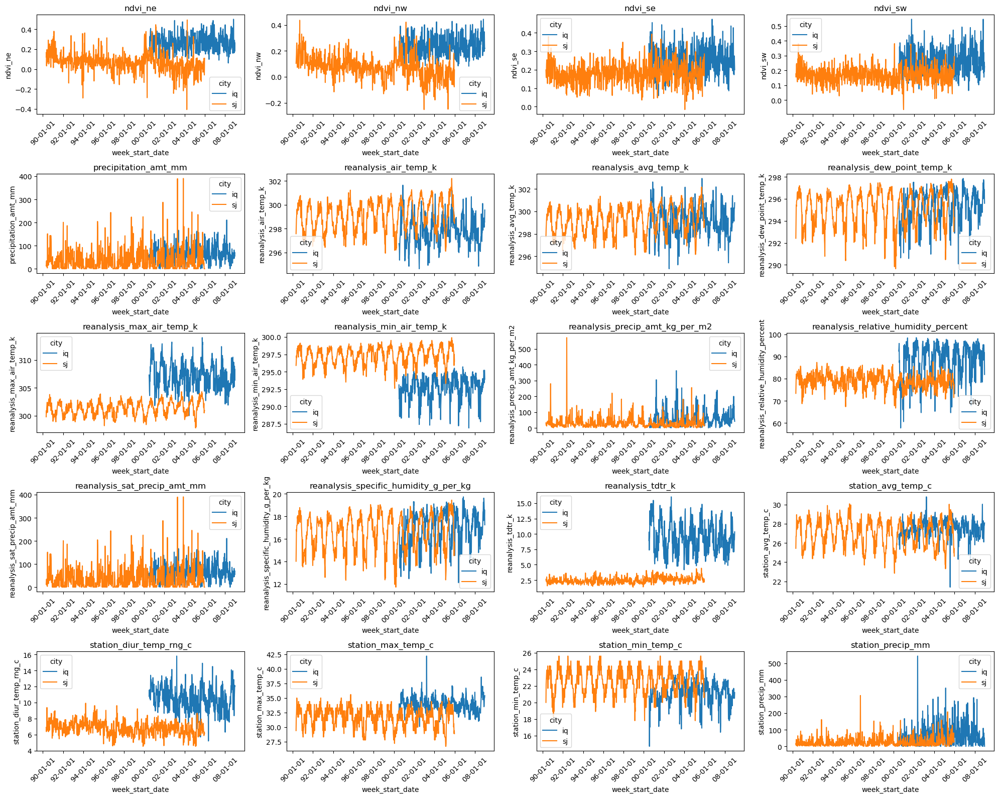

In [23]:
import matplotlib.dates as mdates

def linePlots(data, hue=None):
    fig, axs = plt.subplots(5, 4, figsize=(20, 16))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.lineplot(x='week_start_date', y=col, ax=ax, data=data, hue=hue)
        ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=5, maxticks=15))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%y-%m-%d'))
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)  # Add this line
    plt.tight_layout()
    plt.show()

linePlots(data=df_train, hue='city')

## San Juan
- There appears to be some outliers


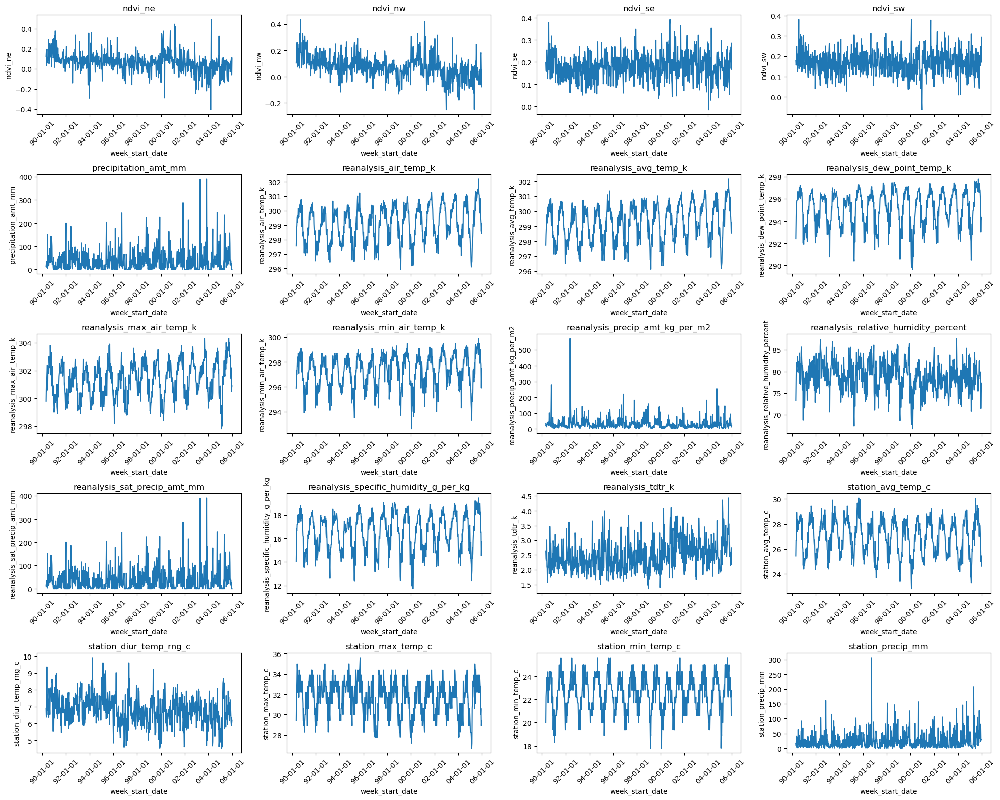

In [24]:
# Data
df_train_sj = df_train.query("city=='sj'")
linePlots(data=df_train_sj)

## Iquitos
- There appears to be some outliers

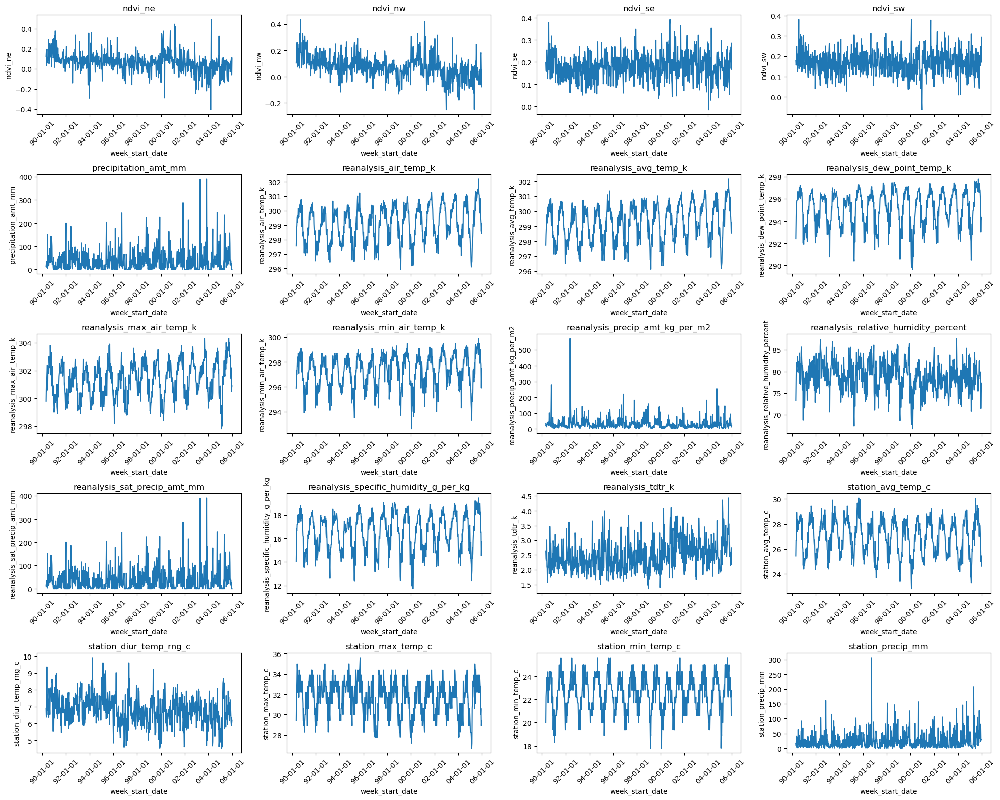

In [25]:
df_train_iq = df_train.query("city!='iq'")
linePlots(data=df_train_iq, hue=None)

## Correlation analysis
Based on the Heatmap above, we observe the following:
*   Vegetation at north east "ndvi_ne" and north west  "ndvi_nw"are highly positively correlated at 0.85 and the vegetation south east "ndvi_se" and southwest "ndvi_sw" positively correlated at 0.82
*   The Average air temperature "reanalysis_avg_temp_k" and  Mean air temperature "reanalysis_air_temp_k" are highly positively correlated at 0.90
*   The Diurnal temperature range "reanalysis_tdtr_k" and Maximum air temperature "reanalysis_max_air_temp_k" are highly positively correlated at 0.92
*    The Diurnal temperature range "reanalysis_tdtr_k" and Total precipitation "reanalysis_precip_amt_kg_per_m2" have a low correlation of 0.094
*   The Mean relative humidity "reanalysis_relative_humidity_percent" and Minimum temperature "station_min_temp_c" have low negative correlation -0.043
* All features seem be weakly correlated with `total_cases`




### Correlation San Juan

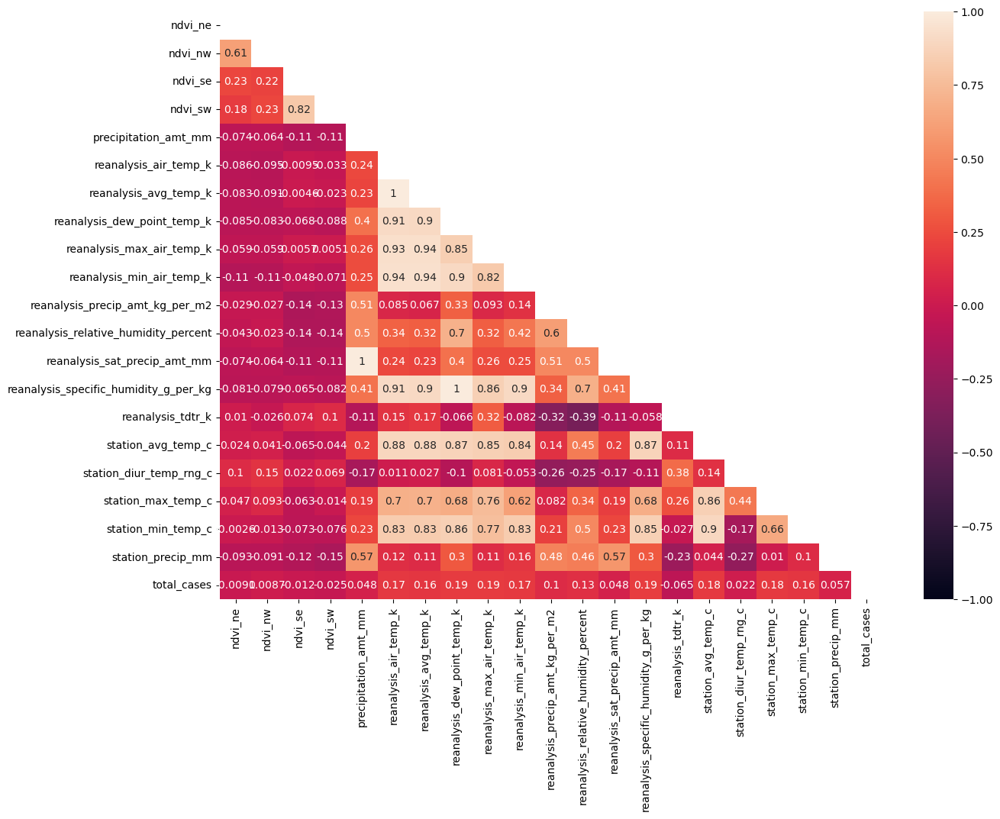

In [26]:
corrMat = df_train.loc[df_train['city']=='sj',features].corr()

mask = np.zeros_like(corrMat)
mask[np.triu_indices_from(mask)]=True


import seaborn as sns
plt.figure(figsize =(14,10))
sns.heatmap(corrMat,vmin = -1, vmax = 1, annot=True, mask=mask)
plt.show()


In [27]:
# Initialize an empty list to store correlated variable pairs
highly_corr_pairs_sj = []

# Iterate over each column in the correlation matrix
for col in corrMat.columns:
    # Find variables with correlation greater than 0.9
    high_corr_vars = corrMat[abs(corrMat[col]) > 0.9].index.to_list()
    
    # If there are more than one highly correlated variables
    if len(high_corr_vars) > 1:
        # Add the pairs to the list
        for var in high_corr_vars:
            if var != col:  # Avoid adding self-correlations
                highly_corr_pairs_sj.append((col, var))

# Print the list of highly correlated variable pairs
print("Highly correlated variable pairs:")
for pair in highly_corr_pairs_sj:
    print(pair)

Highly correlated variable pairs:
('precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm')
('reanalysis_air_temp_k', 'reanalysis_avg_temp_k')
('reanalysis_air_temp_k', 'reanalysis_dew_point_temp_k')
('reanalysis_air_temp_k', 'reanalysis_max_air_temp_k')
('reanalysis_air_temp_k', 'reanalysis_min_air_temp_k')
('reanalysis_air_temp_k', 'reanalysis_specific_humidity_g_per_kg')
('reanalysis_avg_temp_k', 'reanalysis_air_temp_k')
('reanalysis_avg_temp_k', 'reanalysis_max_air_temp_k')
('reanalysis_avg_temp_k', 'reanalysis_min_air_temp_k')
('reanalysis_avg_temp_k', 'reanalysis_specific_humidity_g_per_kg')
('reanalysis_dew_point_temp_k', 'reanalysis_air_temp_k')
('reanalysis_dew_point_temp_k', 'reanalysis_min_air_temp_k')
('reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg')
('reanalysis_max_air_temp_k', 'reanalysis_air_temp_k')
('reanalysis_max_air_temp_k', 'reanalysis_avg_temp_k')
('reanalysis_min_air_temp_k', 'reanalysis_air_temp_k')
('reanalysis_min_air_temp_k', 'reanalysi

### Correlation -- Iquitos

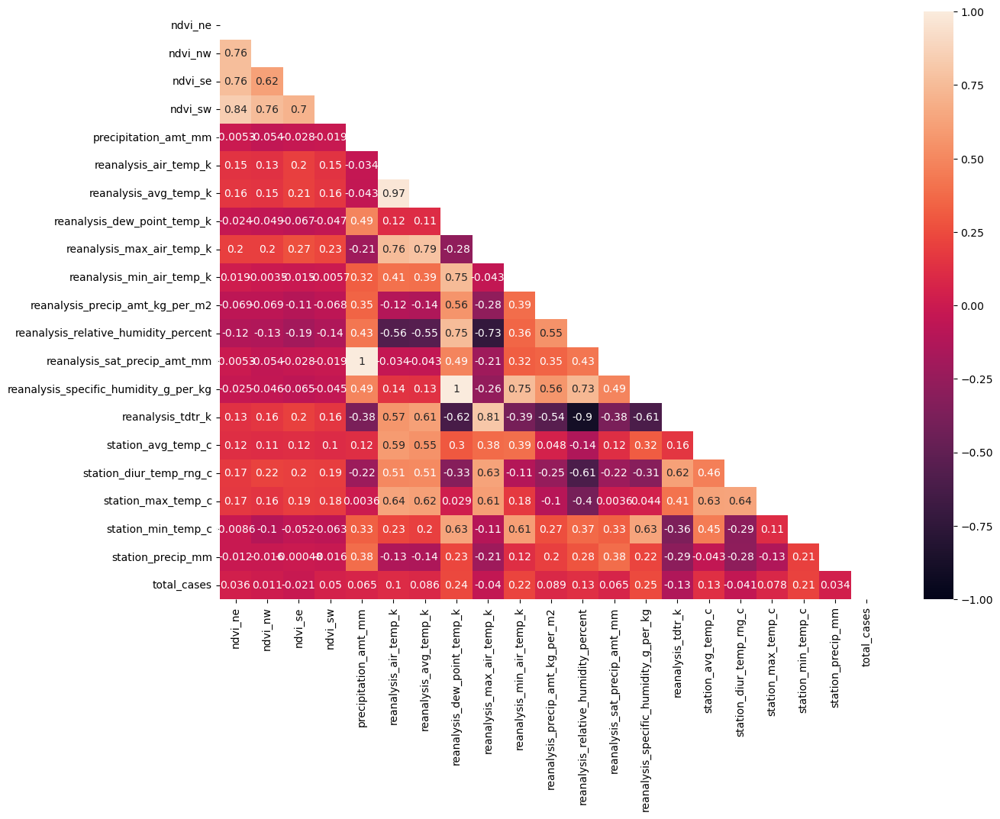

In [28]:
corrMat = df_train.loc[df_train['city']=='iq',features].corr()

mask = np.zeros_like(corrMat)
mask[np.triu_indices_from(mask)]=True


import seaborn as sns
plt.figure(figsize =(14,10))
sns.heatmap(corrMat,vmin = -1, vmax = 1, annot=True, mask=mask)
plt.show()


### Identify highly correlated variables``

In [29]:
# Initialize an empty list to store correlated variable pairs
highly_corr_pairs_iq = []

# Iterate over each column in the correlation matrix
for col in corrMat.columns:
    # Find variables with correlation greater than 0.9
    high_corr_vars = corrMat[abs(corrMat[col]) > 0.9].index.to_list()
    
    # If there are more than one highly correlated variables
    if len(high_corr_vars) > 1:
        # Add the pairs to the list
        for var in high_corr_vars:
            if var != col:  # Avoid adding self-correlations
                highly_corr_pairs_iq.append((col, var))

# Print the list of highly correlated variable pairs
print("Highly correlated variable pairs:")
for pair in highly_corr_pairs_iq:
    print(pair)

Highly correlated variable pairs:
('precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm')
('reanalysis_air_temp_k', 'reanalysis_avg_temp_k')
('reanalysis_avg_temp_k', 'reanalysis_air_temp_k')
('reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg')
('reanalysis_sat_precip_amt_mm', 'precipitation_amt_mm')
('reanalysis_specific_humidity_g_per_kg', 'reanalysis_dew_point_temp_k')


In [30]:
from sklearn.manifold import MDS
dist_mat=1-corrMat
mds = MDS(n_components=2, dissimilarity='precomputed', normalized_stress='auto')
mds_out = mds.fit_transform(dist_mat)

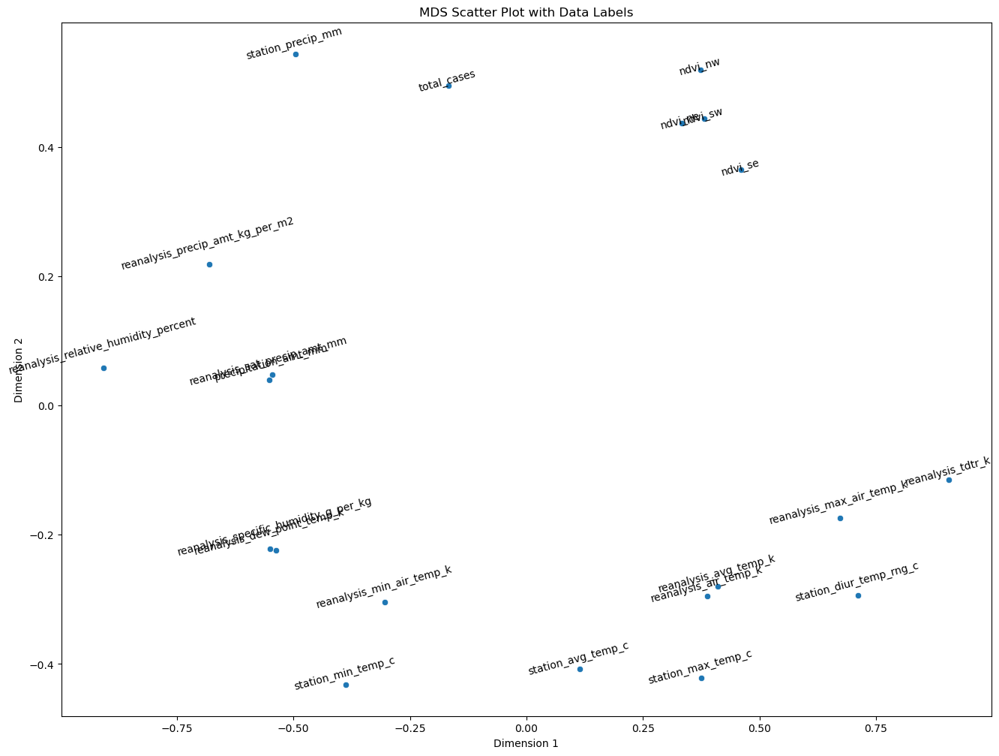

In [31]:
mds_out = pd.DataFrame(mds_out, columns=['c1', 'c2'])
mds_out.index = mds.feature_names_in_

plt.figure(figsize=(16, 12))
sns.scatterplot(data=mds_out,x='c1', y='c2')

for label, x, y in zip(mds_out.index, mds_out['c1'], mds_out['c2']):
    plt.annotate(label, (x, y), textcoords="offset points", xytext=(-1, -5), ha='center', rotation=15)

# Show the plot
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('MDS Scatter Plot with Data Labels')
plt.show()

In [32]:
mds.feature_names_in_

array(['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm',
       'reanalysis_air_temp_k', 'reanalysis_avg_temp_k',
       'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k',
       'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent',
       'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c',
       'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm',
       'total_cases'], dtype=object)

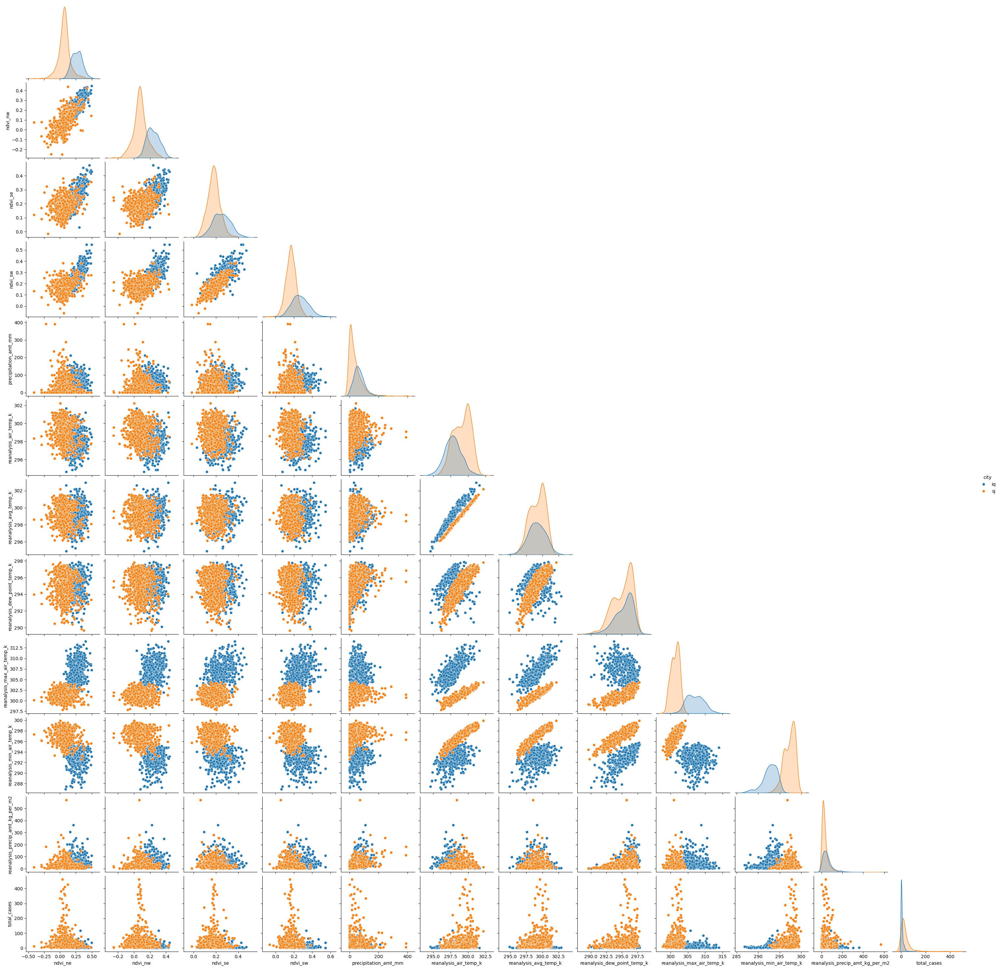

In [33]:
features_set1 = features[:11] + [features[-1]]


sns.pairplot(data=df_train,vars=features_set1, corner=True, hue='city')
plt.show()

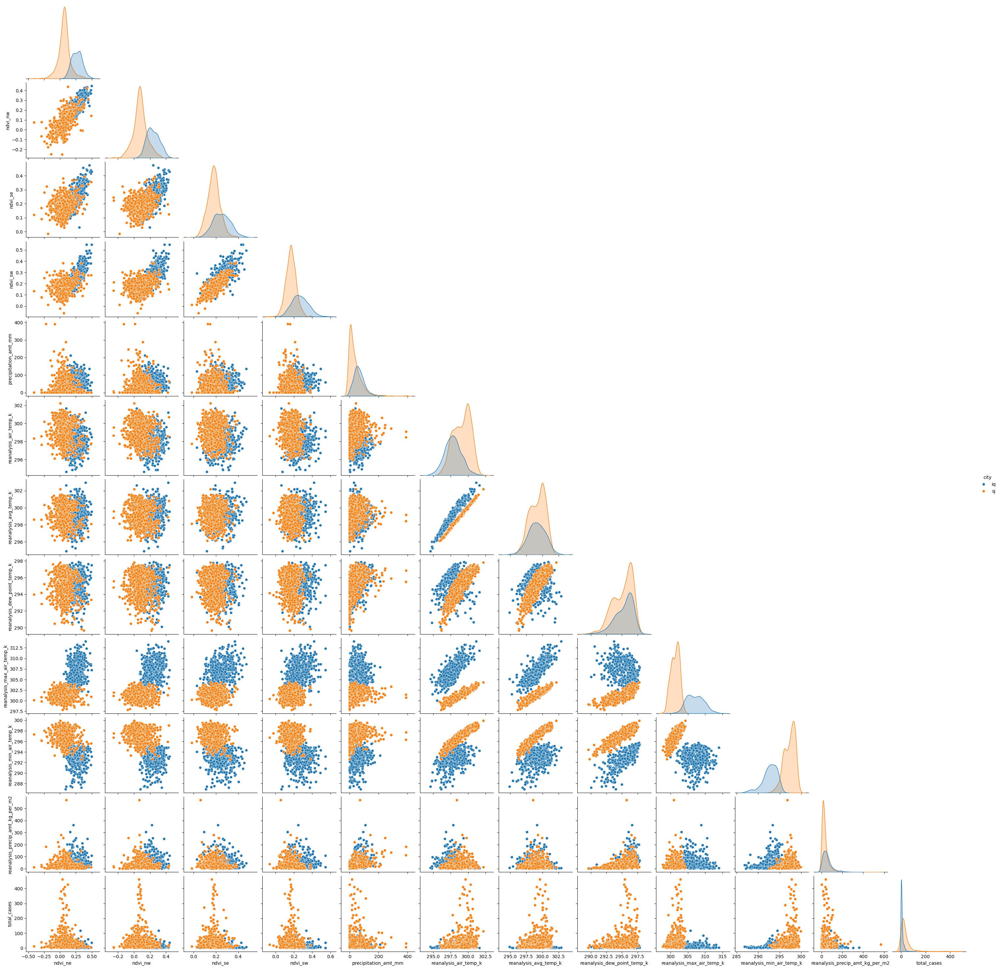

In [34]:
features_set2 = features[11:] + [features[-1]]


sns.pairplot(data=df_train,vars=features_set1, corner=True, hue='city')
plt.show()

## Dengue cases


## Dengue cases time series

- The data spans different periods in the two cities, with some overlaps

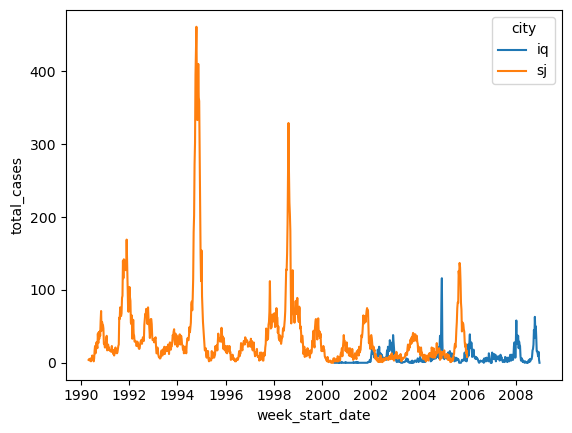

In [35]:
sns.lineplot(data=df_train, x= 'week_start_date', y = 'total_cases', hue='city')
plt.show()

## Iquitos - Total cases
- number of cases are generally high towards end of year (week 40 - 52) and at the beginning of year (week 1 to week 10)
- time feature may me important

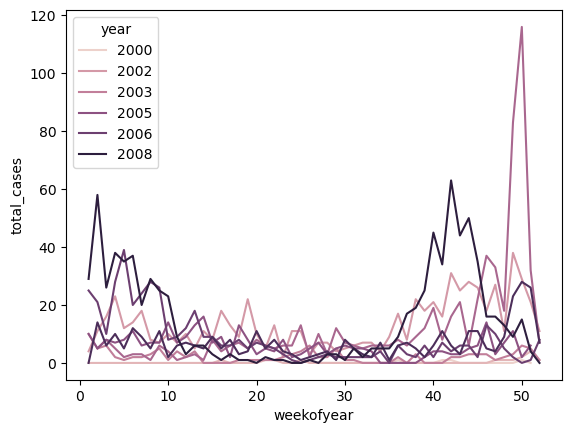

In [36]:
sns.lineplot(data=df_train.loc[df_train['city']=='iq'], x= 'weekofyear', y = 'total_cases', hue='year')
plt.show()

## Cases San Juan
- Also, number of cases are higher towards end of year from around week 35 - 52, and at the beginning of year week 1 - 10 with some few exceptions

In [37]:
# Identify outlier years
# 
outlier_years_sj = df_train.loc[df_train['city']=='sj'].loc[df_train['total_cases']>200,'year'].unique() 
years_sj = df_train.loc[df_train['city']=='sj']['year'].unique()
normal_years_sj = [i for i in years_sj if i not in outlier_years_sj]

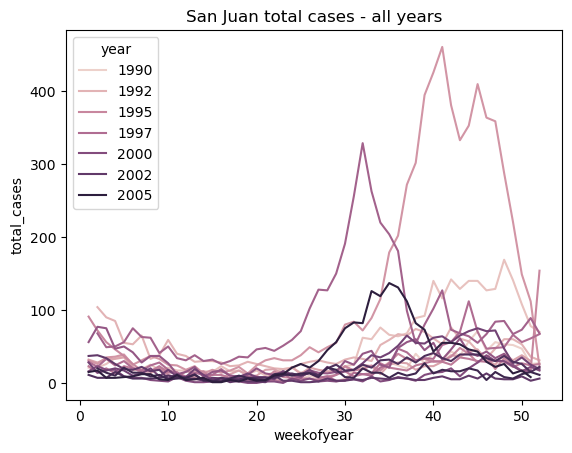

In [38]:
## San Juan - Total cases
cases_sj = df_train.loc[(df_train['city']=='sj') & (df_train['year'].isin(years_sj))]
sns.lineplot(data=cases_sj, x= 'weekofyear', y = 'total_cases', hue='year')
plt.title('San Juan total cases - all years')
plt.show()

Outlier years were identified as those containing too many cases relative to others, distorting the scale. The threshold was 200 cases.

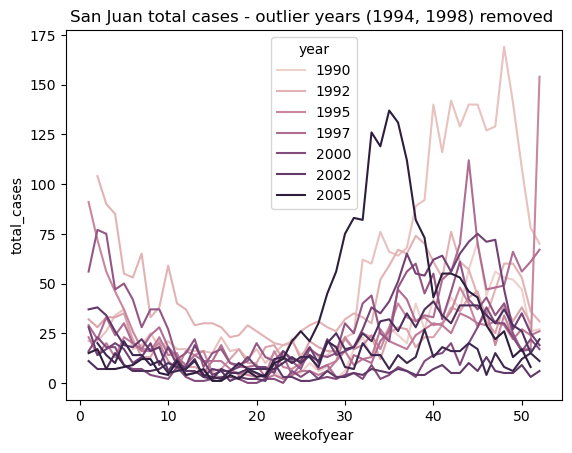

In [39]:
## San Juan - Total cases
cases_sj = df_train.loc[(df_train['city']=='sj') & (df_train['year'].isin(normal_years_sj))]
sns.lineplot(data=cases_sj, x= 'weekofyear', y = 'total_cases', hue='year')
plt.title('San Juan total cases - outlier years (1994, 1998) removed ')
plt.show()

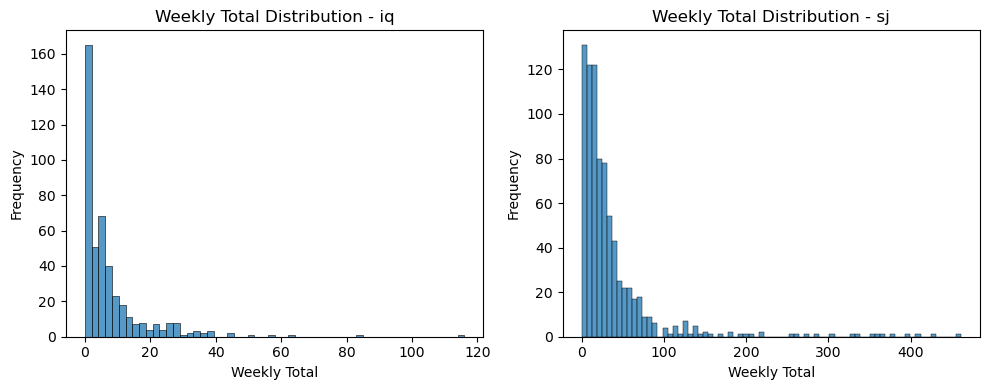

In [40]:
# 
def yearly_pattern(labels_data, city_col, total_cases_col):

    cities = labels_data[city_col].unique()
    num_cities = len(cities)
    fig, axes = plt.subplots(ncols=num_cities, figsize=(10, 4))

    # Iterate over each city and plot distplot
    for i, city in enumerate(cities):
        city_data = labels_data[labels_data[city_col] == city][total_cases_col]
        sns.histplot(city_data, kde=False, ax=axes[i])
        axes[i].set_title(f'Weekly Total Distribution - {city}')
        axes[i].set_xlabel('Weekly Total')
        axes[i].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()


yearly_pattern(df_train, 'city', 'total_cases')

Seems like week 1 and week 53 are the most problematic in the dataset

In [41]:
# Computing median by week
def medianByWeek(df):
    df_med = df[features+['city','weekofyear']].groupby(['city', 'weekofyear']).agg('median').reset_index()
    rename_dict = {}
    for feature in features:
        rename_dict[feature]='med_'+feature
        df_med.rename(rename_dict, inplace=True, axis=1)
    return df_med

df_med = medianByWeek(df=df_train)

In [42]:
df_med


,city,weekofyear,med_ndvi_ne,med_ndvi_nw,med_ndvi_se,med_ndvi_sw,med_precipitation_amt_mm,med_reanalysis_air_temp_k,med_reanalysis_avg_temp_k,med_reanalysis_dew_point_temp_k,...,med_reanalysis_relative_humidity_percent,med_reanalysis_sat_precip_amt_mm,med_reanalysis_specific_humidity_g_per_kg,med_reanalysis_tdtr_k,med_station_avg_temp_c,med_station_diur_temp_rng_c,med_station_max_temp_c,med_station_min_temp_c,med_station_precip_mm,med_total_cases
0,iq,1,0.254714,0.228529,0.250586,0.270400,59.110,298.162857,299.642857,296.060000,...,93.005714,59.110,17.618571,9.757143,28.112500,9.700000,33.30,21.80,72.50,10.0
1,iq,2,0.303274,0.292350,0.290017,0.294814,70.845,297.673571,299.007143,296.157857,...,93.420000,70.845,17.730000,7.828571,27.606667,10.300000,34.20,22.25,60.80,8.0
2,iq,3,0.256493,0.195148,0.268136,0.224971,76.160,298.201429,299.796429,296.355000,...,92.165000,76.160,17.958571,8.864286,28.000000,9.900000,33.80,22.10,96.70,8.0
3,iq,4,0.231279,0.225769,0.214421,0.285093,67.035,297.870000,299.007143,295.833571,...,90.213571,67.035,17.427857,8.100000,27.940000,10.600000,33.90,21.95,56.70,8.5
4,iq,5,0.233014,0.235186,0.196486,0.205543,71.550,298.271429,299.792857,296.392143,...,93.067857,71.550,17.977143,9.042857,27.725000,10.300000,34.35,22.25,89.60,6.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,sj,48,0.108625,0.103867,0.179629,0.166186,16.860,298.832857,298.935714,295.256429,...,80.243571,16.860,16.662857,2.085714,26.335714,6.350000,30.60,22.80,29.90,40.0
100,sj,49,0.056750,0.065875,0.181267,0.206850,4.150,298.560714,298.617857,294.795714,...,78.376429,4.150,16.182857,2.000000,26.278571,6.350000,30.30,21.95,24.15,28.0
101,sj,50,-0.003900,0.014733,0.191386,0.173014,0.000,298.595000,298.667857,294.423571,...,75.265714,0.000,15.802857,2.192857,25.864286,6.607143,29.70,21.70,9.90,31.0
102,sj,51,-0.000425,0.046133,0.182817,0.170057,0.000,298.435714,298.546429,294.222857,...,77.476429,0.000,15.622857,2.200000,25.778571,6.007143,30.30,21.70,22.60,24.5


## Median of features by 
 - There is considerable difference in climate and vegetation between the two cities

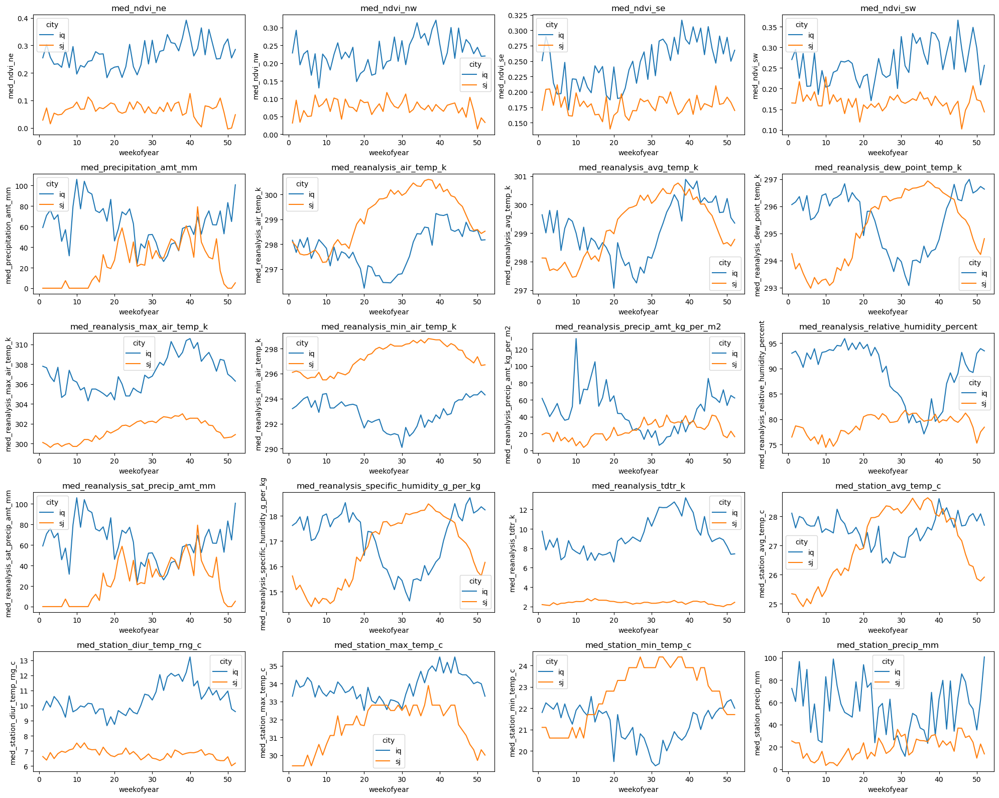

In [43]:
med_features = df_med.columns[1:]

fig, axs = plt.subplots(5,4, figsize = (20,16))
axs = axs.ravel()

for f, ax in zip(med_features[1:],axs):
    sns.lineplot(data=df_med, x = 'weekofyear', y=f, ax=ax, hue='city')
    ax.set_title(f)
plt.tight_layout()


## Features vs Target (standardized)

In [44]:
df_train_iq.columns

Index(['city', 'year', 'weekofyear', 'week_start_date', 'ndvi_ne', 'ndvi_nw',
       'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'total_cases'],
      dtype='object')

## Iquitos
Key observations:
- There is a lagged commovement between temperature and total disease cases in iquitos, eg. increase in temperature is followed by increased number of cases
- The similar effect has also been observed in humidity variable ['reanalysis_specific_humidity_g_per_kg']

In [45]:
import sklearn
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
all_scaled = scaler.fit_transform(X=df_train_iq.iloc[:,4:])
scaler.get_feature_names_out()
df_scaled = pd.DataFrame(all_scaled, columns=scaler.get_feature_names_out())
df_scaled = pd.concat((X[datetimecols], df_scaled), axis=1)

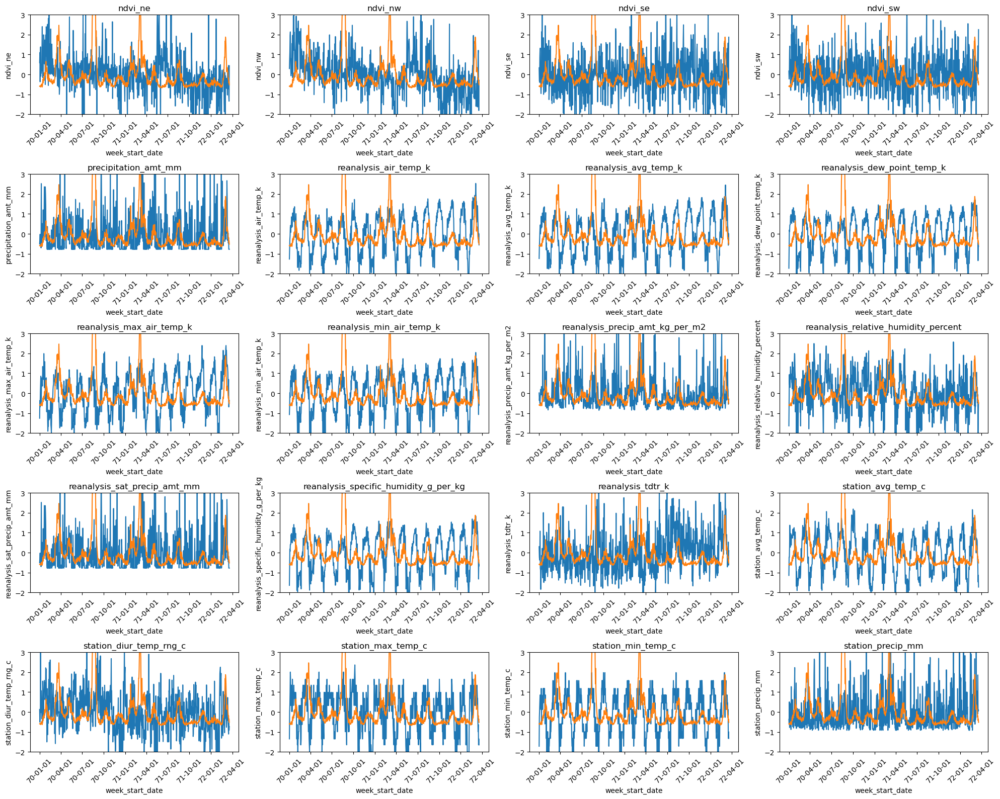

In [46]:
def linePlots2(data, features,hue=None):
    fig, axs = plt.subplots(5, 4, figsize=(20, 16))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.lineplot(x='week_start_date', y=col, ax=ax, data=data, hue=hue)
        sns.lineplot(x='week_start_date', y='total_cases', ax=ax, data=data, hue=hue)
        ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=5, maxticks=15))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%y-%m-%d'))
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)
        ax.set_ylim(-2,3)
    plt.tight_layout()
    plt.show()

linePlots2(data=df_scaled[df_scaled['city']=='sj'], features=features)

## Box plots
- The scales of features are quite different, scling may be necessary for non-tree based algorithms
- Outliers are also evident especially for precipitation

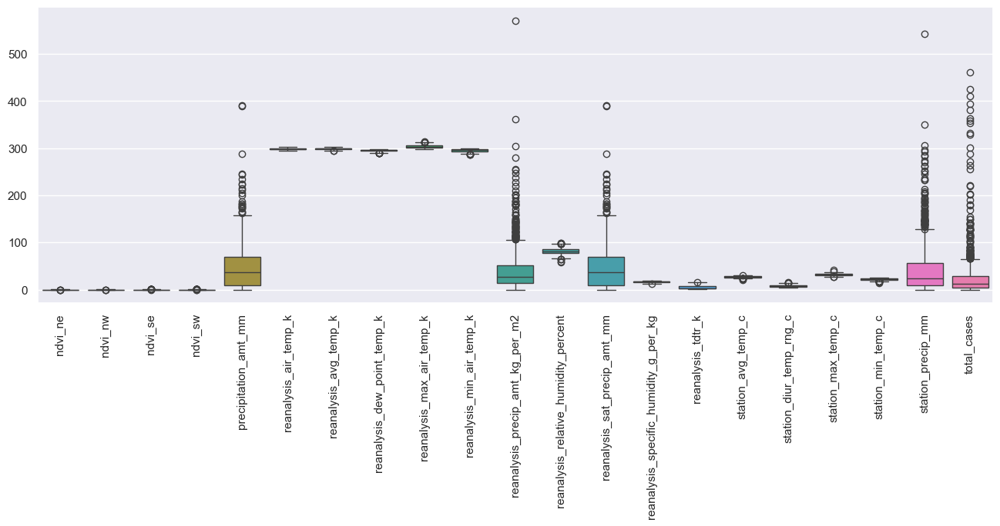

In [47]:
sns.set(rc={'figure.figsize': (16, 5)})

# Create the boxplot
ax = sns.boxplot(data=df_train[features[:]])
ax.tick_params(axis='x', rotation=90)


# Show the plot
plt.show()

### Box plots
- There is considerable difference between cities esp. for vegetation, humidity and temperature
- It may necessitate doing analysis separately
- Cases in in San Juan are generally higher compared to Iquitos

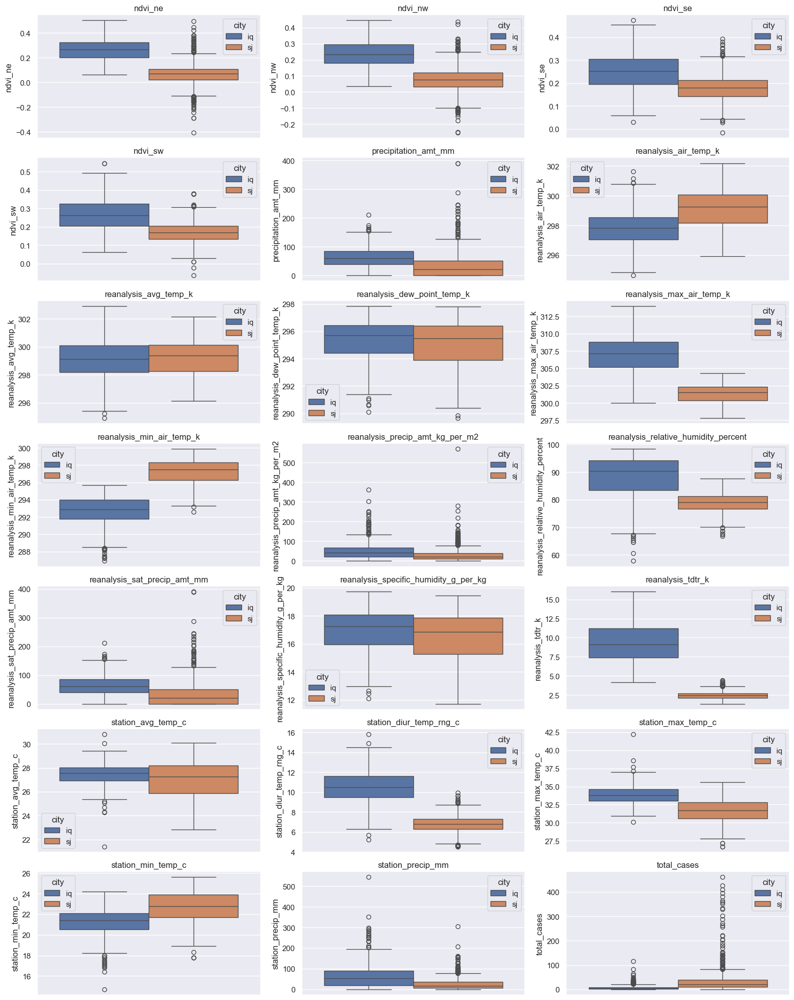

In [48]:
def boxplots(data, features,hue=None):
    fig, axs = plt.subplots(7, 3, figsize=(16, 20))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.boxplot(y=col, ax=ax, data=data, hue=hue)
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

boxplots(data=df_train, features=features, hue='city')

In [49]:
ndvi = list(filter(lambda x: re.search(r'ndvi_', x), features))
precip = list(filter(lambda x: re.search(r'preci', x), features))
humid = list(filter(lambda x: re.search(r'humid', x), features))
temp = list(filter(lambda x: re.search(r'temp|tdtr', x), features))
# tdtr = list(filter(lambda x: re.search(r'tdtr', x), features))

In [50]:
## PCA PLOTS
from sklearn.decomposition import PCA
pca = PCA(n_components=2, whiten=True)

pca_ndvi = pca.fit_transform(df_train.loc[df_train['city']=='sj',ndvi])
print('ndvi', pca.explained_variance_ratio_)
pca_ndvi = pd.DataFrame(pca_ndvi, columns=['pc1','pc2'])


pca_precip = pca.fit_transform(df_train.loc[df_train['city']=='sj',precip])
print('precip', pca.explained_variance_ratio_)
pca_precip = pd.DataFrame(pca_precip, columns=['pc1','pc2'])

pca_temp = pca.fit_transform(df_train.loc[df_train['city']=='sj',temp])
print('temp', pca.explained_variance_ratio_)
pca_temp = pd.DataFrame(pca_temp, columns=['pc1','pc2'])


ndvi [0.60810573 0.22842592]
precip [0.77866656 0.1463693 ]
temp [0.79642597 0.10359842]


In [51]:
# df_train.loc[:,'l_total_cases'] = np.log(1+df_train['total_cases'])

#EDA: Data Visualization
[Helen]

In [52]:
# df_train['week_start_date'] = pd.to_datetime(df_train['week_start_date'])
# df_train.set_index('week_start_date', inplace=True)

In [53]:
# from statsmodels.tsa.seasonal import seasonal_decompose
# city = df_train[df_train['city'] == 'iq']
# result = seasonal_decompose(city['precipitation_amt_mm'].resample('M').sum(), model='additive')
# result.plot()
# plt.show()

Observation of the Trends and Seasons of Iquitos:


*   The trend appears to be stable with slight flunctuations over the years, a slight upward trend can be observed around 2005 but it returns to more average levels afterward and then rises before 2007.
*   The Seasonal pattern is clear and consistent over the years. Peaks and troughs appear regularly, indicating consistent wetter and drier periods each year.
*   The residuals, which represent the noise after removing the trend and seasonality, don't show any significant outliers or patterns. They're relatively stable and clustered around the zero line.

In [54]:
# from statsmodels.tsa.seasonal import seasonal_decompose
# city = df_train[df_train['city'] == 'sj']
# result = seasonal_decompose(city['precipitation_amt_mm'].resample('M').sum(), model='additive')
# result.plot()
# plt.show()

Observation of the Trends and Seasons of San Juan:


*   The trend appears to be stable with slight undulations over the years, there is no strong long term increase or decrease in the population during the time period.
*   The Seasonal pattern is clear and consistent over the years. The amplitude of the season flunctuations are roughly the same size each year.
*   The residuals have a few outliers, seen as dots further away 

##### Dropping one highly correlated variables from the following pairs, 
- ['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']
- ['reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg']
- ['reanalysis_max_air_temp_k', 'reanalysis_tdtr_k']

## Prepare training and testing data

In [55]:
## Generate dummies for outliers
# This applies for training data, we pretend we dont know labels for testing data
df_train['month'] = df_train['week_start_date'].dt.month
df_test['total_cases'] = df_test['total_cases']+1

df_test['month'] = df_test['week_start_date'].dt.month
df_test['total_cases'] = df_test['total_cases']+1

In [56]:
df_train.loc[:,'month'].value_counts()


month
7     125
10    118
4     116
9     107
1     107
8     100
11    100
12    100
5      96
6      96
2      92
3      92
Name: count, dtype: int64

In [57]:
highly_corr_pairs_sj
for i in highly_corr_pairs_sj:
    print(i[1])




reanalysis_sat_precip_amt_mm
reanalysis_avg_temp_k
reanalysis_dew_point_temp_k
reanalysis_max_air_temp_k
reanalysis_min_air_temp_k
reanalysis_specific_humidity_g_per_kg
reanalysis_air_temp_k
reanalysis_max_air_temp_k
reanalysis_min_air_temp_k
reanalysis_specific_humidity_g_per_kg
reanalysis_air_temp_k
reanalysis_min_air_temp_k
reanalysis_specific_humidity_g_per_kg
reanalysis_air_temp_k
reanalysis_avg_temp_k
reanalysis_air_temp_k
reanalysis_avg_temp_k
reanalysis_dew_point_temp_k
precipitation_amt_mm
reanalysis_air_temp_k
reanalysis_avg_temp_k
reanalysis_dew_point_temp_k


In [170]:
# columns to drop from variable featured
# If you want to keep all variables just, change columns2drop -- leave 'total_cases' only

def features2drop(colums2drop):
    features2keep = [f for f in df_train.columns if f not in colums2drop]
    return features2keep

base_cols = ['city', 'weekofyear','year','week_start_date', 'total_cases']

colums2drop_iq = base_cols #+ list(set([i[1] for i in highly_corr_pairs_iq]))
colums2drop_sj = base_cols + list(set([i[1] for i in highly_corr_pairs_sj]))

features2keep_iq = features2drop(colums2drop_iq)
features2keep_sj = features2drop(colums2drop_sj)

def generate_data(input_data, city, features):
    return input_data.loc[input_data['city']==city,features]

X_train_iq = generate_data(df_train,'iq', features2keep_iq)
X_train_sj = generate_data(df_train,'sj', features2keep_sj)

X_test_iq = generate_data(df_test,'iq', features2keep_iq)
X_test_sj = generate_data(df_test,'sj', features2keep_sj)


# Target - Train
y_train_iq = df_train.loc[df_train['city']=='iq',['total_cases']]['total_cases']
y_train_sj = df_train.loc[df_train['city']=='sj',['total_cases']]['total_cases']

# Target - Test
y_test_iq = df_test.loc[df_test['city']=='iq',['total_cases']]['total_cases']
y_test_sj = df_test.loc[df_test['city']=='sj',['total_cases']]['total_cases']

# def generate_training_test_sets()
# X_train_iq = df_train.loc[df_train['city']=='iq',features2keep_iq]
# X_train_sj = df_train.loc[df_train['city']=='sj',features2keep_sj]

# Settting indices
# X_train_iq.index = df_train.loc[df_train['city']=='iq', 'week_start_date']
# X_train_sj.index = df_train.loc[df_train['city']=='sj', 'week_start_date']

# Test set
# X_test_iq = df_test.loc[df_test['city']=='iq',features2keep_iq]
# X_test_sj = df_test.loc[df_test['city']=='sj',features2keep_sj]

# Settting indices
# X_test_iq.index = df_test.loc[df_test['city']=='iq', 'week_start_date']
# X_test_sj.index = df_test.loc[df_test['city']=='sj', 'week_start_date']

# Target - Train
# y_train_iq = df_train.loc[df_train['city']=='iq',['total_cases']]['total_cases']
# y_train_sj = df_train.loc[df_train['city']=='sj',['total_cases']]['total_cases']

# Settting indices
# y_train_iq.index = df_train.loc[df_train['city']=='iq', 'week_start_date']
# y_train_sj.index = df_train.loc[df_train['city']=='sj', 'week_start_date']

# Target - Test
# y_test_iq = df_test.loc[df_test['city']=='iq',['total_cases']]['total_cases']
# y_test_sj = df_test.loc[df_test['city']=='sj',['total_cases']]['total_cases']

# y_test_iq.index = df_test.loc[df_test['city']=='iq', 'week_start_date']
# y_test_sj.index = df_test.loc[df_test['city']=='sj', 'week_start_date']



In [59]:
# features2keep_sj


In [60]:
print(f"Years Train iq: {df_train.loc[df_train['city']=='iq', 'year'].unique()}")
print(f"Years Test iq: {df_test.loc[df_test['city']=='iq', 'year'].unique()}")
# df_test['year'].unique()

Years Train iq: [2000 2001 2002 2003 2004 2005 2006 2007 2008]
Years Test iq: [2009 2010]


In [61]:
print(f"Years Train sj: {df_train.loc[df_train['city']=='sj', 'year'].unique()}")
print(f"Years Test sj: {df_test.loc[df_test['city']=='sj', 'year'].unique()}")

Years Train sj: [1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005]
Years Test sj: [2006 2007 2008]


## MODELS

In [62]:
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.svm import SVR
from sklearn.compose import TransformedTargetRegressor, ColumnTransformer
from sklearn.model_selection import GridSearchCV, cross_val_score, TimeSeriesSplit
from sklearn.metrics import mean_absolute_error
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso

CITY = 'iq'
# Model without parameter tuning - San Juan

scaler = Pipeline([('scaler', StandardScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])

transformer = ColumnTransformer([('scaler', scaler, features2keep_iq)])

regressor = SVR(kernel='rbf', C=0.6)
tscv = TimeSeriesSplit(n_splits=5)

target_transformer = TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)

pipeline = Pipeline(steps=[('preprocess', transformer), ('select', selector) ,('tranform_target', target_transformer)])
# pipeline = Pipeline(steps=[('preprocess', transformer),('tranform_target', log_target)])
# pipeline = Pipeline(steps=[('preprocess', transformer), ('regress', regressor)])

# compute cross validation error
mae_cv = cross_val_score(estimator= pipeline,X=X_train_iq, y=y_train_iq, cv=tscv)
print(f"MAE cv {CITY} {-np.mean(mae_cv)}")


model = pipeline.fit(X=X_train_iq, y=y_train_iq)
# y_pred_tr = model.predict(X_train_iq)

y_pred_iq = model.predict(X_test_iq)



mae = mean_absolute_error(y_true=y_test_iq, y_pred=y_pred_iq)
print(f"MAE: {mae:.2f}")


MAE cv iq 0.6062013890706128
MAE: 5.06


In [63]:
X_train_iq.columns

Index(['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'reanalysis_max_air_temp_k',
       'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'month'],
      dtype='object')

In [64]:
lasso_selector = model.named_steps['select'].named_steps['lasso']

# Get the selected feature indices
selected_feature_indices = lasso_selector.get_support()

# Get the selected feature names
selected_feature_names = X_train_iq.columns[selected_feature_indices]
print(selected_feature_names)

Index(['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'reanalysis_max_air_temp_k',
       'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_max_temp_c', 'station_min_temp_c',
       'station_precip_mm', 'month'],
      dtype='object')


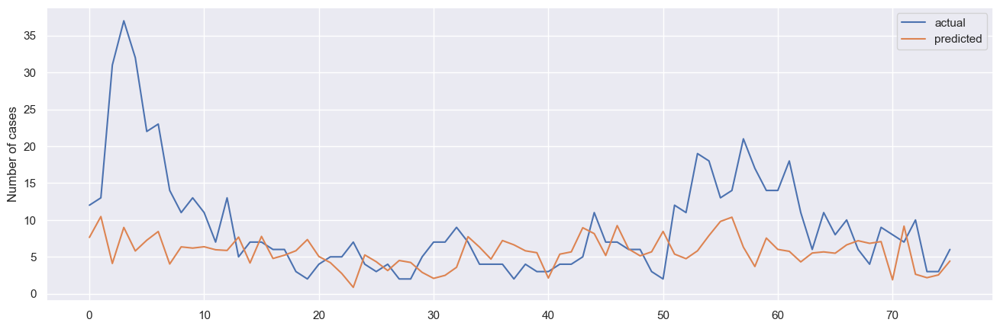

In [65]:
y_pred_iq = pd.Series(y_pred_iq, index=y_test_iq.index)

plt.plot(y_test_iq, label='actual')
plt.plot(y_pred_iq, label = 'predicted')
plt.legend()
plt.ylabel('Number of cases')
plt.show()

In [66]:
# Model without parameter tuning - San Juan
scaler = Pipeline([('scaler', StandardScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])

transformer = ColumnTransformer([('scaler', scaler, features2keep_sj)])

regressor = SVR(kernel='rbf')

target_transformer = TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)

pipeline = Pipeline(steps=[('preprocess', transformer), ('select', selector) ,('target_transform', target_transformer)])

mae_cv = cross_val_score(estimator=pipeline,X=X_train_sj,y=y_train_sj, cv=tscv)
print(f"MAE CV {-np.mean(mae_cv):.2f}")

model = pipeline.fit(X=X_train_sj, y=y_train_sj)
# y_pred_tr = model.predict(X_train_iq)

y_pred_sj = model.predict(X_test_sj)

mae = mean_absolute_error(y_true=y_test_sj, y_pred=y_pred_sj)
print(f"MAE: {mae:.2f}")

MAE CV 0.52
MAE: 14.28


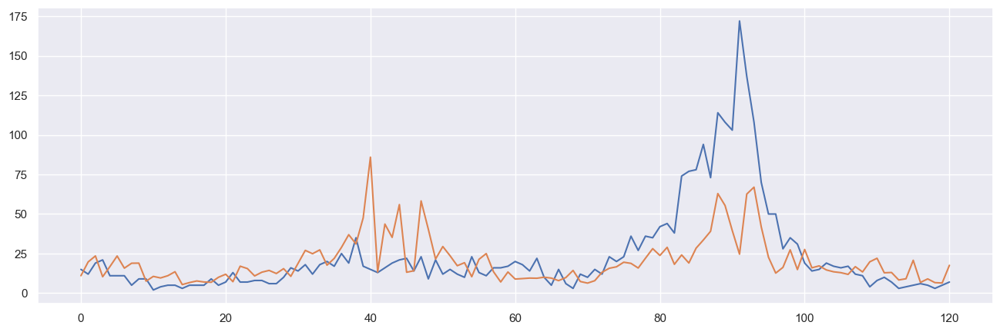

In [67]:
plt.plot(np.array(y_test_sj))
plt.plot(y_pred_sj)


## Finetuning SVR

In [230]:
from sklearn.model_selection import cross_val_score, TimeSeriesSplit
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso
from sklearn.compose import ColumnTransformer
from sklearn.svm import SVR
from sklearn.compose import TransformedTargetRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
import numpy as np

CITY = 'iq'

# Define the preprocessing steps
scaler = Pipeline([('scaler', RobustScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])
transformer = ColumnTransformer([('scaler', scaler, features2keep_iq)])

# Define the transformed target regressor
regressor = SVR()
target_transformer = TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)

# Create the pipeline
pipeline = Pipeline(steps=[('preprocess', transformer), ('select', selector), ('transform_target', target_transformer)])

# Define the hyperparameter grid for grid search
param_grid = {
    'transform_target__regressor__C': np.linspace(0.01, 1, 10),
    'transform_target__regressor__kernel': ['rbf', 'poly', 'linear'],
    'transform_target__regressor__gamma': np.linspace(0.001, 0.1, 20)
}

# Perform grid search

tscv = TimeSeriesSplit(n_splits=5)

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, n_jobs=-1, scoring='neg_mean_absolute_error')
models = grid_search.fit(X=X_train_iq, y=y_train_iq)
best_model = models.best_estimator_

# Evaluate the best model
best_model_mae_cv = cross_val_score(estimator=best_model, X=X_train_iq, y=y_train_iq, scoring='neg_mean_absolute_error')

mean_mae_cv = round(-np.mean(best_model_mae_cv),3)
sd_mae_cv = round(np.std(best_model_mae_cv),3)

print(f"Cross-validated MAE -{CITY}: {mean_mae_cv:.2f}")

y_pred_iq = best_model.predict(X_test_iq)
mae = mean_absolute_error(y_true=y_test_iq, y_pred=y_pred_iq)
print(f"MAE on test set -{CITY}: {mae:.2f}")


# save results
res_svr_iq = {'algorithm': ['SVR'],
       'city': ['Iquitos'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [round(mae,3)]
         }

res_svr_iq


Cross-validated MAE -iq: 6.67
MAE on test set -iq: 4.77


{'algorithm': ['SVR'],
 'city': ['Iquitos'],
 'MAE CV': [6.674],
 'MAE SD': [1.689],
 'MAE test': [4.771]}

In [231]:
# Check parameters of the best model
best_model.named_steps['transform_target'].regressor.get_params()

{'C': 0.45,
 'cache_size': 200,
 'coef0': 0.0,
 'degree': 3,
 'epsilon': 0.1,
 'gamma': 0.06352631578947368,
 'kernel': 'rbf',
 'max_iter': -1,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

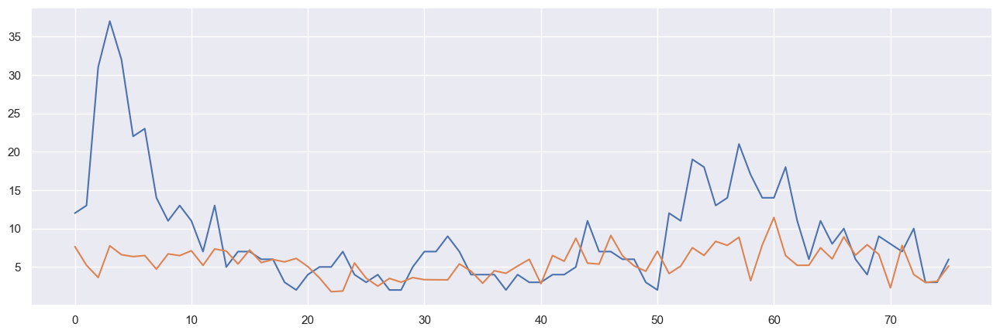

In [232]:
plt.plot(np.array(y_test_iq))
plt.plot(y_pred_iq)


### SVR for San Juan Tuning


In [225]:

CITY = 'sj'

# Define the preprocessing steps
scaler = Pipeline([('scaler', StandardScaler())])
# selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.5)))])
transformer = ColumnTransformer([('scaler', scaler, features2keep_sj)])
# ('selector', selector, features2keep_sj)

# Define the transformed target regressor
regressor = SVR()
target_transformer = TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)


# Create the pipeline
pipeline = Pipeline(steps=[('preprocess', transformer), ('transform_target', target_transformer)])
# pipeline = Pipeline(steps=[('preprocess', transformer), ('transform_target', target_transformer)])

param_grid = {
    'transform_target__regressor__C': np.linspace(0.1, 1, 10),
    'transform_target__regressor__kernel': ['rbf', 'poly', 'linear'],
    # 'select__lasso__estimator__alpha':[0]
    # 'transform_target__regressor__gamma': np.linspace(0.001, 0.1, 10)
}

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, scoring='neg_mean_absolute_error')

models = grid_search.fit(X=X_train_sj, y=y_train_sj)
best_model = models.best_estimator_

# Evaluate the best model
best_model_mae_cv = cross_val_score(estimator=best_model, X=X_train_sj, y=y_train_sj, scoring='neg_mean_absolute_error')

mean_mae_cv = round(-np.mean(best_model_mae_cv),3)
sd_mae_cv = round(np.std(best_model_mae_cv),3)

print(f"Cross-validated MAE -{CITY}: {-np.mean(best_model_mae_cv):.2f}")

y_pred_sj = best_model.predict(X_test_sj)
mae = mean_absolute_error(y_true=y_test_sj, y_pred=y_pred_sj)
print(f"MAE on test set -{CITY}: {mae:.2f}")


# save results
res_svr_sj = {'algorithm': ['SVR'],
       'city': ['San Juan'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [round(mae,3)]
         }

res_svr_sj

Cross-validated MAE -sj: 25.00
MAE on test set -sj: 14.47


{'algorithm': ['SVR'],
 'city': ['San Juan'],
 'MAE CV': [25.003],
 'MAE SD': [9.992],
 'MAE test': [14.472]}

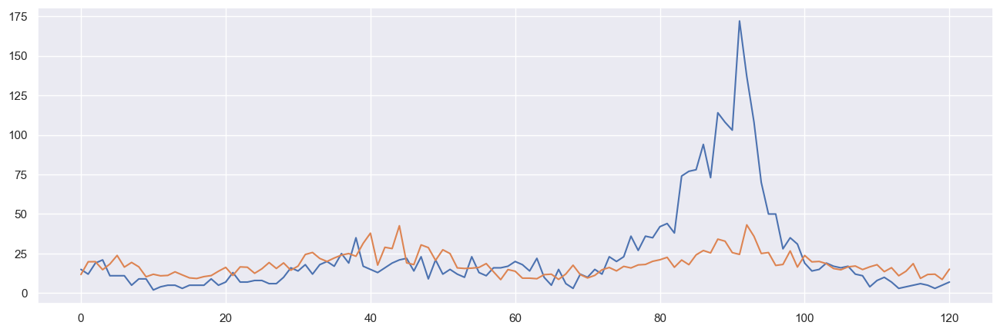

In [76]:
plt.plot(np.array(y_test_sj))
plt.plot(y_pred_sj)


In [77]:
# %pip install protobuf

Note: you may need to restart the kernel to use updated packages.


## LSTM

In [78]:
# import tensorflow as tf
# from sklearn.preprocessing import StandardScaler
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import LSTM, Dense, InputLayer, Dropout, Attention
# from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
# from tensorflow.keras.losses import MeanSquaredError, MeanAbsoluteError
# from tensorflow.keras.metrics import MeanAbsoluteError
# from tensorflow.keras.optimizers import Adam
# from keras.optimizers import Adam

# tf.random.set_seed(2024)

# # Prepare data
# time_steps = 4

# def data_to_3D(dfx, dfy, time_steps):
#     X = []
#     y = []
#     for i in range(len(dfx) - time_steps):
#         X.append(dfx[i:i+time_steps])  # Extracting past 'time_steps' weeks data for each sample
#         y.append(dfy.values[i+time_steps])     # Extracting the target variable for the next week
#     return np.array(X), np.array(y)


# scaler = RobustScaler()

# # Training and validation data
# XX_train_iq1, yy_train_iq1 = X_train_iq.iloc[:len(X_train_iq)-103,:], y_train_iq[:len(y_train_iq)-103]
# XX_val_iq1, yy_val_iq1 = X_train_iq.iloc[len(X_train_iq)-103:,:], y_train_iq[len(y_train_iq)-103:]

# # scale data
# XX_train_iq2 = scaler.fit_transform(XX_train_iq1)
# XX_val_iq2 = scaler.fit_transform(XX_val_iq1)
# X_test_iq2 = scaler.fit_transform(X_test_iq)
# # Converting data to 3D
# XX_train_iq, yy_train_iq = data_to_3D(XX_train_iq2, yy_train_iq1, time_steps=time_steps)
# XX_val_iq, yy_val_iq = data_to_3D(XX_val_iq2, yy_val_iq1, time_steps=time_steps)
# XX_test_iq, yy_test_iq = data_to_3D(X_test_iq2, y_test_iq, time_steps=time_steps)
# # # scale
# # X_test_iq = scaler.fit_transform(X_test_iq)


# model = Sequential([
#     InputLayer(input_shape=(time_steps, len(X_train_iq.columns))),
#     LSTM(5),
#     Dropout(0.2),
#     # Attention(name='attention_weights'),
#     Dense(units=500, activation='relu'),
#     Dense(units=100, activation='relu'),
#     Dense(units=1, activation='linear')
# ])

# model.summary()

# early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
# check_point = ModelCheckpoint('model/', save_best_only=True)

# model.compile(loss=MeanSquaredError(), optimizer=Adam(learning_rate=0.01), metrics=[MeanAbsoluteError()])
# model.fit(XX_train_iq, yy_train_iq, validation_data=(XX_val_iq, yy_val_iq), epochs=60, callbacks=[early_stopping,check_point])



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 5)                 420       
                                                                 
 dropout (Dropout)           (None, 5)                 0         
                                                                 
 dense (Dense)               (None, 500)               3000      
                                                                 
 dense_1 (Dense)             (None, 100)               50100     
                                                                 
 dense_2 (Dense)             (None, 1)                 101       
                                                                 
Total params: 53,621
Trainable params: 53,621
Non-trainable params: 0
_________________________________________________________________
Epoch 1/60
 1/11 [=>............................] - 

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 4s 232ms/step - loss: 125.7675 - mean_absolute_error: 6.1284 - val_loss: 220.7707 - val_mean_absolute_error: 8.5868
Epoch 2/60
 1/11 [=>............................] - ETA: 0s - loss: 24.8445 - mean_absolute_error: 3.8241

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 200ms/step - loss: 105.4616 - mean_absolute_error: 5.6212 - val_loss: 188.1883 - val_mean_absolute_error: 8.2660
Epoch 3/60
11/11 [==============================] - 0s 4ms/step - loss: 103.6989 - mean_absolute_error: 6.0306 - val_loss: 220.8078 - val_mean_absolute_error: 8.5695
Epoch 4/60
 1/11 [=>............................] - ETA: 0s - loss: 82.1463 - mean_absolute_error: 6.2799

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 206ms/step - loss: 102.5869 - mean_absolute_error: 5.8012 - val_loss: 182.2983 - val_mean_absolute_error: 8.2663
Epoch 5/60
11/11 [==============================] - 0s 4ms/step - loss: 93.8873 - mean_absolute_error: 5.7493 - val_loss: 201.3935 - val_mean_absolute_error: 8.4486
Epoch 6/60
11/11 [==============================] - 0s 4ms/step - loss: 90.6902 - mean_absolute_error: 5.6079 - val_loss: 194.5182 - val_mean_absolute_error: 8.1586
Epoch 7/60
11/11 [==============================] - 0s 4ms/step - loss: 94.1618 - mean_absolute_error: 5.5808 - val_loss: 189.0997 - val_mean_absolute_error: 8.1716
Epoch 8/60
11/11 [==============================] - 0s 4ms/step - loss: 84.3978 - mean_absolute_error: 5.6032 - val_loss: 208.1076 - val_mean_absolute_error: 8.2860
Epoch 9/60
 1/11 [=>............................] - ETA: 0s - loss: 21.8060 - mean_absolute_error: 3.4173

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 193ms/step - loss: 70.6981 - mean_absolute_error: 5.2196 - val_loss: 176.9128 - val_mean_absolute_error: 8.3498
Epoch 10/60
11/11 [==============================] - 0s 4ms/step - loss: 56.7942 - mean_absolute_error: 5.0847 - val_loss: 206.8763 - val_mean_absolute_error: 8.6070
Epoch 11/60
 1/11 [=>............................] - ETA: 0s - loss: 139.5325 - mean_absolute_error: 5.9994

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 208ms/step - loss: 70.6358 - mean_absolute_error: 4.9210 - val_loss: 173.7410 - val_mean_absolute_error: 8.3197
Epoch 12/60
11/11 [==============================] - 0s 6ms/step - loss: 77.6265 - mean_absolute_error: 5.3793 - val_loss: 200.1966 - val_mean_absolute_error: 8.0979
Epoch 13/60
11/11 [==============================] - 0s 4ms/step - loss: 43.7771 - mean_absolute_error: 4.4845 - val_loss: 188.2730 - val_mean_absolute_error: 8.2491
Epoch 14/60
11/11 [==============================] - 0s 4ms/step - loss: 48.2994 - mean_absolute_error: 4.5608 - val_loss: 199.6443 - val_mean_absolute_error: 8.1736
Epoch 15/60
11/11 [==============================] - 0s 5ms/step - loss: 44.3965 - mean_absolute_error: 4.6215 - val_loss: 213.6007 - val_mean_absolute_error: 8.8444
Epoch 16/60
11/11 [==============================] - 0s 5ms/step - loss: 46.5023 - mean_absolute_error: 4.3880 - val_loss: 209.2720 - val_mean_absolute_error: 8.4535
Epoch 17/60
11

4/4 [==============================] - 0s 1ms/step


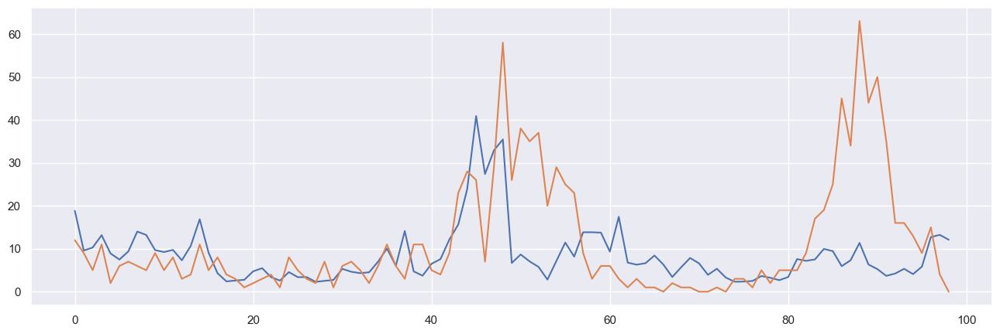

In [79]:
# from tensorflow.keras.models import load_model
# model = load_model('model/')

# pred_train = model.predict(XX_val_iq).flatten()
# output_train = pd.DataFrame({'Pred Train': pred_train, 'Actual':yy_val_iq})
# # output_train
# plt.plot(output_train['Pred Train'])
# plt.plot(output_train['Actual'])


3/3 [==============================] - 0s 3ms/step
MAE 4.900720165835486


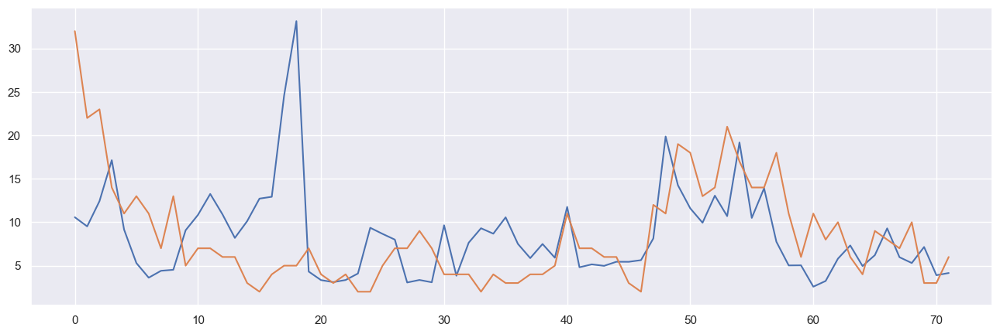

In [80]:
# from tensorflow.keras.models import load_model
# model = load_model('model/')

# pred_test = model.predict(XX_test_iq).flatten()
# output_test = pd.DataFrame({'Pred': pred_test, 'Actual':yy_test_iq})
# # output_train
# plt.plot(output_test['Pred'])
# plt.plot(output_test['Actual'])
# print(f"MAE {mean_absolute_error(y_pred=pred_test, y_true=yy_test_iq)}")


## XGboost - Iq

In [ ]:
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

In [219]:
import xgboost
from xgboost import XGBRegressor


CITY = 'iq'

# Define the preprocessing steps
scaler = Pipeline([('scaler', StandardScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])
transformer = ColumnTransformer([('scaler', scaler, features2keep_iq)])

# Define the transformed target regressor
xgb = XGBRegressor()

# xgb.fit(X_train_iq, y_train_iq)
target_transformer = TransformedTargetRegressor(regressor=xgb, func=np.log1p, inverse_func=np.expm1)

# Create the pipeline
tscv = TimeSeriesSplit(n_splits=5)


# Define the preprocessing steps
scaler = Pipeline([('scaler', RobustScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])
transformer = ColumnTransformer([('scaler', scaler, features2keep_iq)])

# Define the transformed target regressor
xgb = XGBRegressor()

# xgb.fit(X_train_iq, y_train_iq)
target_transformer = TransformedTargetRegressor(regressor=xgb, func=np.log1p, inverse_func=np.expm1)

# Create the pipeline
tscv = TimeSeriesSplit(n_splits=5)
# pipeline = Pipeline(steps=[('preprocess', transformer), ('regressor', xgb)])
pipeline = Pipeline(steps=[('preprocess', transformer), ('target_transformer', target_transformer)])


param_grid = {
    'target_transformer__regressor__learning_rate': [0.001,0.05,0.09],
    'target_transformer__regressor__max_depth': [3, 4, 6, 10],
    'target_transformer__regressor__gamma': [0.01, 0.02],
    'target_transformer__regressor__n_estimators': [100,300],
    'target_transformer__regressor__reg_lambda': [1,3,5],
}


grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='neg_mean_absolute_error', n_jobs=-1, cv=tscv)

model = grid_search.fit(X_train_iq, y_train_iq)
best_model = model.best_estimator_
mae_cv = cross_val_score(best_model, X_train_iq, y_train_iq, cv=tscv)

mean_mae_cv = -np.mean(mae_cv)
mean_mae_sd = np.std(mae_cv)

# mae = mean_absolute_error(y_pred=y_pred_iq, y_true=y_test_iq )
y_pred = best_model.predict(X_test_iq)
mae = mean_absolute_error(y_pred=y_pred, y_true=y_test_iq)

print(f"CV MAE {-np.mean(mae_cv)}")
print(f"Test MAE: {mae}")

# save results
res_xgb_iq = {'algorithm': ['XGboost'],
       'city': ['Iquitos'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae]
         }
res_xgb_iq


CV MAE 0.5824676680265715
Test MAE: 5.253626525402069


{'algorithm': ['XGboost'],
 'city': ['Iquitos'],
 'MAE CV': [0.5824676680265715],
 'MAE SD': [0.9795145122027623],
 'MAE test': [5.253626525402069]}

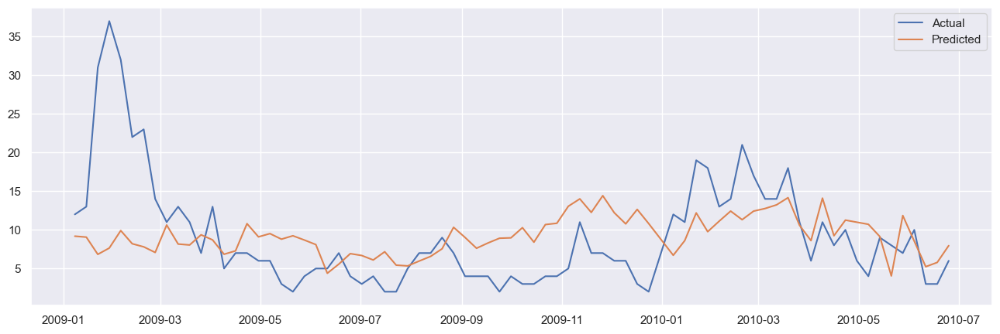

In [202]:
def plot_predict(source_data, actual, predicted):
    df_pred = pd.DataFrame({'Actual':actual, 'Predicted':predicted})
    df_pred.index = source_data['week_start_date']
    plt.plot(df_pred['Actual'], label='Actual')
    plt.plot(df_pred['Predicted'], label='Predicted')
    plt.legend()

plot_predict(df_test_iq, y_test_iq, y_pred_iq)

# df_pred = pd.DataFrame({'Actual':y_test_iq, 'Predicted':y_pred_iq})
# df_pred.index = df_test_iq['week_start_date']
# plt.plot(df_pred['Actual'], label='Actual')
# plt.plot(df_pred['Predicted'], label='Predicted')
# plt.legend()

In [ ]:
best_model.named_steps['target_transformer']

## Finetune xgb

In [176]:
CITY = 'sj'

# Define the preprocessing steps
scaler = Pipeline([('scaler', RobustScaler())])
# selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])
transformer = ColumnTransformer([('scaler', scaler, features2keep_sj)])

# Define the transformed target regressor
xgb = XGBRegressor()

# xgb.fit(X_train_iq, y_train_iq)
target_transformer = TransformedTargetRegressor(regressor=xgb, func=np.log1p, inverse_func=np.expm1)

# Create the pipeline
tscv = TimeSeriesSplit(n_splits=5)
# pipeline = Pipeline(steps=[('preprocess', transformer), ('regressor', xgb)])
pipeline = Pipeline(steps=[('preprocess', transformer), ('target_transformer', target_transformer)])

param_grid = {
    'target_transformer__regressor__learning_rate': [0.001, 0.005, 0.09],
    'target_transformer__regressor__max_depth': [4, 6, 7,12],
    'target_transformer__regressor__gamma': [0.01, 0.02],
    'target_transformer__regressor__n_estimators': [500, 700] 
}


grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='neg_mean_absolute_error', n_jobs=-1, cv=tscv)

model = grid_search.fit(X_train_sj, y_train_sj)

best_model = model.best_estimator_
mae_cv = cross_val_score(best_model, X_train_sj, y_train_sj, cv=tscv)
mean_mae_cv = -np.mean(mae_cv)
sd_mae_cv = np.std(mae_cv)

# mae = mean_absolute_error(y_pred=y_pred_iq, y_true=y_test_iq )
y_pred_sj = best_model.predict(X_test_sj)
mae = mean_absolute_error(y_pred=y_pred_sj, y_true=y_test_sj)

print(f"CV MAE {-np.mean(mae_cv)}")
print(f"Test MAE San Juan {mae}")


res_xgb_sj = {'algorithm': ['XGboost'],
       'city': ['San Juan'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae]
         }
res_xgb_sj

CV MAE 0.22266672994727615
Test MAE San Juan 13.745080009964871


{'algorithm': ['XGboost'],
 'city': ['San Juan'],
 'MAE CV': [0.22266672994727615],
 'MAE SD': [0.38404295152684553],
 'MAE test': [13.745080009964871]}

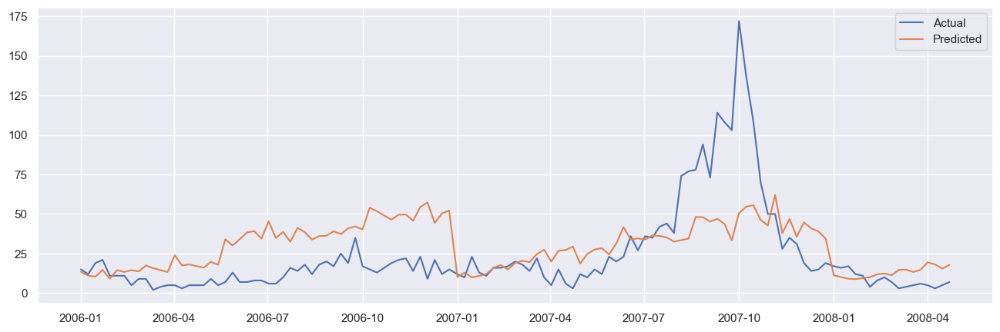

In [203]:
plot_predict(df_test_sj, y_test_sj, y_pred_sj)

POISSON REGRESSION


In [192]:
from sklearn.linear_model import PoissonRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler


pipeline = Pipeline(steps=[('scaler', StandardScaler()), ('regressor',PoissonRegressor())])
# make_pipeline(StandardScaler(), PoissonRegressor())

param_grid = {
    'regressor__alpha': [2.0, 3.0, 5.0],   # Regularization parameter (L1)
    'regressor__fit_intercept': [True, False],  # Whether to fit an intercept term
    'regressor__max_iter': [200, 300,500],  # Maximum number of iterations
}

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv)

# Fit the model for Iquitos
model = grid_search.fit(X_train_iq, y_train_iq)
best_model = model.best_estimator_

mae_cv = cross_val_score(estimator=best_model, X=X_train_iq, y=y_train_iq, cv=tscv)

mean_mae_cv = -np.mean(mae_cv)
sd_mae_cv = np.std(mae_cv)

# Predict for Iquitos
y_pred_iq = best_model.predict(X_test_iq)

# Calculate Mean Absolute Error for Iquitos
mae = mean_absolute_error(y_test_iq, y_pred_iq)


res_poisson_iq = {'algorithm': ['Poisson'],
       'city': ['Iquitos'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae]
         }
res_poisson_iq



{'algorithm': ['Poisson'],
 'city': ['Iquitos'],
 'MAE CV': [2.210871836585876],
 'MAE SD': [3.6644546589571703],
 'MAE test': [5.008132832809671]}

In [193]:
poisson=best_model.named_steps['regressor']
poisson.get_params()

{'alpha': 5.0,
 'fit_intercept': True,
 'max_iter': 200,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

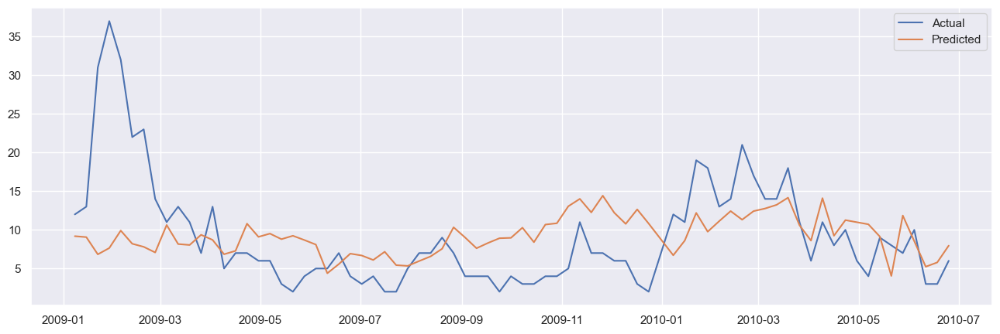

In [205]:
plot_predict(df_test_iq, y_test_iq, y_pred_iq)

In [217]:

pipeline = Pipeline(steps=[('scaler', StandardScaler()), ('regressor',PoissonRegressor())])
# make_pipeline(StandardScaler(), PoissonRegressor())

param_grid = {
    'regressor__alpha': np.linspace(0,20, 10),   # Regularization parameter (L1)
    'regressor__fit_intercept': [True, False],  # Whether to fit an intercept term
    'regressor__max_iter': [500, 1000],  # Maximum number of iterations
}

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv)

# Fit the model for Iquitos
model = grid_search.fit(X_train_sj, y_train_sj)
best_model = model.best_estimator_

mae_cv = cross_val_score(estimator=best_model, X=X_train_sj, y=y_train_sj, cv=tscv)

mean_mae_cv = -np.mean(mae_cv)
sd_mae_cv = np.std(mae_cv)

# Predict for Iquitos
y_pred_sj = best_model.predict(X_test_sj)

# Calculate Mean Absolute Error for Iquitos
mae = mean_absolute_error(y_test_sj, y_pred_sj)


res_poisson_sj = {'algorithm': ['Poisson'],
       'city': ['San Juan'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae]
         }
res_poisson_sj


{'algorithm': ['Poisson'],
 'city': ['Iquitos'],
 'MAE CV': [0.7619951344217768],
 'MAE SD': [0.9795145122027623],
 'MAE test': [19.618275627060978]}

In [216]:

poisson=best_model.named_steps['regressor']
poisson.get_params()

{'alpha': 20.0,
 'fit_intercept': True,
 'max_iter': 500,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

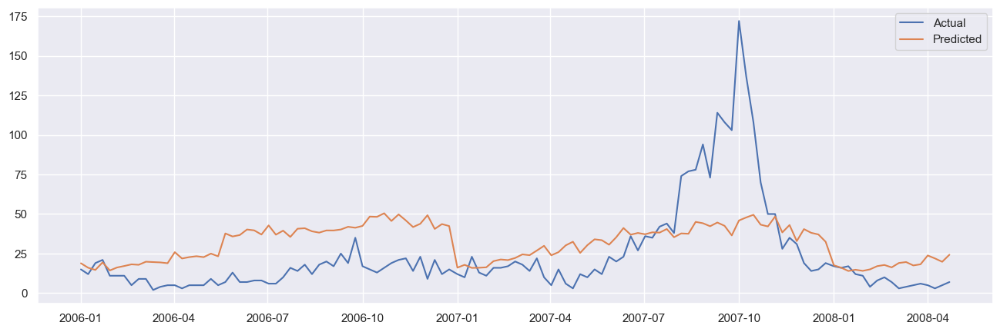

In [215]:
plot_predict(df_test_sj, y_test_sj, y_pred_sj)

RANDOM FOREST

In [245]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import cross_val_score


pipeline = Pipeline(steps=[('scaler', StandardScaler()), ('regressor',RandomForestRegressor(random_state=2024, n_jobs=-1))])
# make_pipeline(StandardScaler(), PoissonRegressor())

param_grid = {
    'regressor__n_estimators': [200, 300, 500],   # Regularization parameter (L1)
    'regressor__max_depth': [3,6,10],  # Whether to fit an intercept term
}

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, scoring='neg_mean_absolute_error')

# Fit the model for Iquitos
model = grid_search.fit(X_train_sj, y_train_sj)
best_model = model.best_estimator_

mae_cv = cross_val_score(estimator=best_model, X=X_train_sj, y=y_train_sj, cv=tscv)

mean_mae_cv = -np.mean(mae_cv)
sd_mae_cv = np.std(mae_cv)

# Predict for Iquitos
y_pred_sj = best_model.predict(X_test_sj)

# Calculate Mean Absolute Error for Iquitos
mae = mean_absolute_error(y_test_sj, y_pred_sj)


res_rf_sj = {'algorithm': ['Random Forest'],
       'city': ['San Juan'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae]
         }
res_rf_sj



{'algorithm': ['Random Forest'],
 'city': ['San Juan'],
 'MAE CV': [2.5827749319602185],
 'MAE SD': [3.720434721640558],
 'MAE test': [19.17588694983697]}

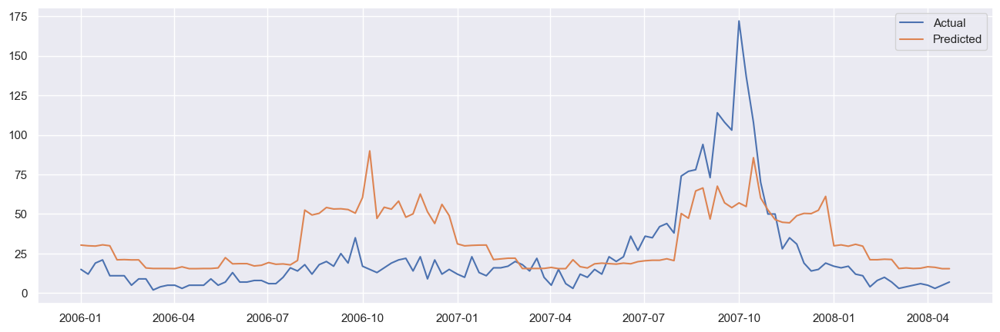

In [246]:
plot_predict(df_test_sj, y_test_sj, y_pred_sj)

In [247]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import cross_val_score


pipeline = Pipeline(steps=[('scaler', StandardScaler()), ('regressor',RandomForestRegressor(random_state=2024, n_jobs=-1))])
# make_pipeline(StandardScaler(), PoissonRegressor())

param_grid = {
    'regressor__n_estimators': [200, 300, 500],   # Regularization parameter (L1)
    'regressor__max_depth': [3,6,10],  # Whether to fit an intercept term
}

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, scoring='neg_mean_absolute_error')

# Fit the model for Iquitos
model = grid_search.fit(X_train_iq, y_train_iq)
best_model = model.best_estimator_

mae_cv = cross_val_score(estimator=best_model, X=X_train_iq, y=y_train_iq, cv=tscv)

mean_mae_cv = -np.mean(mae_cv)
sd_mae_cv = np.std(mae_cv)

# Predict for Iquitos
y_pred_iq = best_model.predict(X_test_iq)

# Calculate Mean Absolute Error for Iquitos
mae = mean_absolute_error(y_test_iq, y_pred_iq)


res_rf_iq = {'algorithm': ['Random Forest'],
       'city': ['San Juan'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae]
         }
res_rf_iq



{'algorithm': ['Random Forest'],
 'city': ['San Juan'],
 'MAE CV': [0.9267920842349024],
 'MAE SD': [0.6747988012357494],
 'MAE test': [5.102288343438645]}

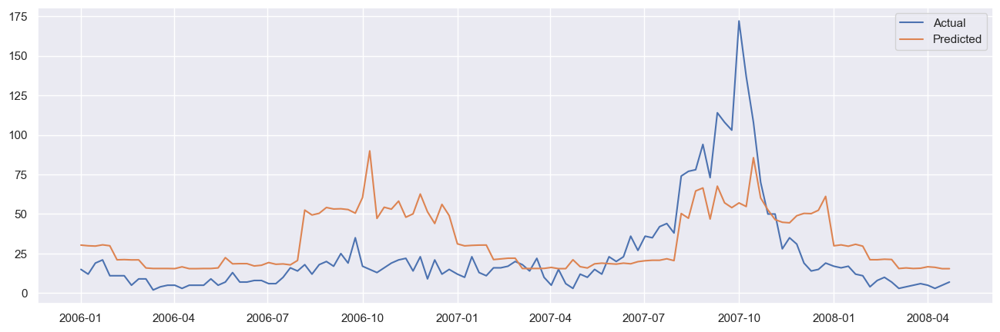

In [248]:
plot_predict(df_test_sj, y_test_sj, y_pred_sj)

# Exporting results to Latex

In [256]:
# Combine all results
def merge_res(d1,d2): #Function to merge dictionary
    return {k: [*d1.get(k, []), *d2.get(k, [])] for k in set(d1) | set(d2)}

from functools import reduce
metrics = reduce(merge_res, [res_svr_iq, res_svr_sj, res_xgb_sj, res_xgb_iq, res_poisson_sj, res_poisson_iq, res_rf_sj, res_rf_iq])

metrics1 = pd.DataFrame(metrics)[['city', 'algorithm','MAE CV', 'MAE SD', 'MAE test']]

metrics1.to_latex()


import os
# Model comparison
try:
    # Create the directory if it doesn't exist
    dest_path = './tables'
    os.makedirs(dest_path, exist_ok=True)

    # Convert DataFrame to LaTeX
    metrix = metrics1.to_latex(float_format='%.3f',index=False)
    print(metrix)
    # Write the LaTeX string to the file
    with open('./tables/metrix.tex', 'w') as f:
        f.write(metrix)
except Exception as e:
    print(e)


\begin{tabular}{llrrr}
\toprule
city & algorithm & MAE CV & MAE SD & MAE test \\
\midrule
Iquitos & SVR & 6.674 & 1.689 & 4.771 \\
San Juan & SVR & 25.003 & 9.992 & 14.472 \\
San Juan & XGboost & 0.223 & 0.384 & 13.745 \\
Iquitos & XGboost & 0.582 & 0.980 & 5.254 \\
Iquitos & Poisson & 0.762 & 0.980 & 19.618 \\
Iquitos & Poisson & 2.211 & 3.664 & 5.008 \\
San Juan & Random Forest & 2.583 & 3.720 & 19.176 \\
San Juan & Random Forest & 0.927 & 0.675 & 5.102 \\
\bottomrule
\end{tabular}



In [253]:
metrics1.columns
metrics1[['city', 'algorithm','MAE CV', 'MAE SD', 'MAE test']]

,city,algorithm,MAE CV,MAE SD,MAE test
0,Iquitos,SVR,6.674000,1.689000,4.771000
1,San Juan,SVR,25.003000,9.992000,14.472000
2,San Juan,XGboost,0.222667,0.384043,13.745080
3,Iquitos,XGboost,0.582468,0.979515,5.253627
4,Iquitos,Poisson,0.761995,0.979515,19.618276
5,Iquitos,Poisson,2.210872,3.664455,5.008133
6,San Juan,Random Forest,2.582775,3.720435,19.175887
7,San Juan,Random Forest,0.926792,0.674799,5.102288
